# Importation des différentes librairies et fonctions :

In [1]:
import sys
sys.path.append('/Users/max/Desktop/Cours/DESU/Projet/test_loading_mat')
from test_loading_mat import parse_value, read_matlab_txt_file

In [2]:
sys.path.append('/Users/max/Desktop/Cours/DESU')
from imports import *

In [3]:
sys.path.append('/Users/max/Desktop/Cours/DESU')
from preprocess import *

In [4]:
sys.path.append('/Users/max/Desktop/Cours/DESU')
from function_interest import *

# Importation des données : 

In [5]:
data = read_mat_txt_files_improved("CSV_EXPORT2")

Fichier C20250429_20250506-B6 lu avec read_matlab_txt_file - Shape : (1192, 13)
Fichier C20250415_20250422-B2 lu avec read_matlab_txt_file - Shape : (1232, 13)
Fichier C20250415_20250423-B1 lu avec read_matlab_txt_file - Shape : (413, 13)
Fichier C20250429_20250506-B1 lu avec read_matlab_txt_file - Shape : (1592, 13)
Fichier C20241210_20241217 lu avec read_matlab_txt_file - Shape : (2346, 13)
Fichier C20250415_20250422-B5 lu avec read_matlab_txt_file - Shape : (3209, 13)
DataFrame créé : df_C20250429_20250506-B6
DataFrame créé : df_C20250415_20250422-B2
DataFrame créé : df_C20250415_20250423-B1
DataFrame créé : df_C20250429_20250506-B1
DataFrame créé : df_C20241210_20241217
DataFrame créé : df_C20250415_20250422-B5

Total : 6 fichiers chargés


# Nettoyage des données (Preprocessing) :

Pour le preprocessing, il est plus intéressant de travailler avec un seul dataframe, plutôt que plusierus dataframes.

In [6]:
columns_inutiles = ['tracks_raw', 'tracks_interp', 'crossdetection_IDrelated']

df_implemented_all = data_implementation(data, columns_inutiles)

Pourcentage de valeurs manquantes par colonne : 
 ID_IDn                 0.000000
ID_acqTag              0.000000
ID_acqN                0.000000
ID_modality            0.000000
tracks_smooth          0.000000
crossdetection_bool    0.000000
velocity_topend        0.000000
velocity_instant       9.385016
signal_I               0.030048
signal_sigma           0.030048
dtype: float64

Types de données :
 ID_IDn                  object
ID_acqTag               object
ID_acqN                  int64
ID_modality              int64
tracks_smooth           object
crossdetection_bool     object
velocity_topend        float64
velocity_instant        object
signal_I               float64
signal_sigma           float64
dtype: object

Valeurs manquantes :
 ID_IDn                   0
ID_acqTag                0
ID_acqN                  0
ID_modality              0
tracks_smooth            0
crossdetection_bool      0
velocity_topend          0
velocity_instant       937
signal_I                 3
sign

## Sélection des données avec un treshold sur la vitesse

Créer en amont une colonne vitesse se basant sur la vitesse absolue de ces données et non sur la moyenne.

In [7]:
df_implemented_all['speed_global'] = df_implemented_all['tracks_smooth'].apply(vitesse_globale)

In [8]:
df_implemented_all = df_implemented_all[(df_implemented_all['speed_global'] < -0.12) | (df_implemented_all['speed_global'] > 0.12)]

Faire ce treshold est important pour enlever le peu de cargo (ou autres organites cellulaires ne se déplacant pas ou ayant juste des variations de positions à cause de l'enregistrement).

## Observation des outliers sur le signal_I

In [9]:
df_implemented_all = isolation_forest(df_implemented_all, 'signal_I')

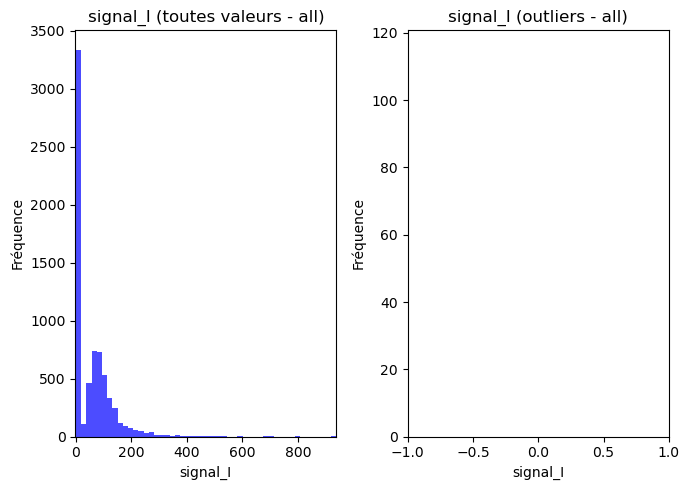

Index([ 907, 1086, 1106, 1724, 2191, 2852, 2853, 2854, 2857, 2860,
       ...
       9303, 9304, 9352, 9390, 9473, 9498, 9564, 9569, 9571, 9948],
      dtype='int64', length=352)
352


In [10]:
fig, axs = plt.subplots(1, 2, figsize=(7, 5))

# Toutes les valeurs - df_implemented_all
axs[0].hist(df_implemented_all['signal_I'], bins=50, color='blue', alpha=0.7)
axs[0].set_title("signal_I (toutes valeurs - all)")
axs[0].set_xlabel("signal_I")
axs[0].set_xlim(-1, df_implemented_all['signal_I'].max())
axs[0].set_ylabel("Fréquence")

# Outliers - df_implemented_all
axs[1].hist(df_implemented_all[df_implemented_all['signal_I_outlier']]['signal_I'], bins=20, color='red', alpha=0.7)
axs[1].set_title("signal_I (outliers - all)")
axs[1].set_xlabel("signal_I")
axs[1].set_ylabel("Fréquence")
axs[1].set_xlim(-1, df_implemented_all['signal_I_outlier'].max())


plt.tight_layout()
plt.show()

print(df_implemented_all[df_implemented_all['signal_I_outlier']][['signal_I']].index)
print(len(df_implemented_all[df_implemented_all['signal_I_outlier']]))

In [11]:
df_implemented_all = df_implemented_all[~df_implemented_all['signal_I_outlier']]

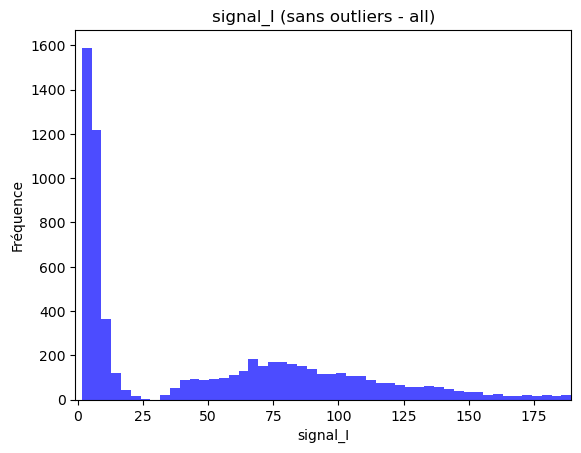

In [12]:
plt.hist(df_implemented_all['signal_I'], bins=50, color='blue', alpha=0.7)
plt.title("signal_I (sans outliers - all)")
plt.xlabel("signal_I")
plt.xlim(-1, df_implemented_all['signal_I'].max())
plt.ylabel("Fréquence")
plt.show()

## Seuils sur signal_I/dispersion, déplacement et sur durée du track :

### Déplacement

In [13]:
df_implemented_all['deplacement_net'] = df_implemented_all['tracks_smooth'].apply(deplacement_net)

### Signal_I (ration signal/dispersion)

In [14]:
df_implemented_all['signal_dispersion'] = df_implemented_all['tracks_smooth'].apply(calculer_dispersion_track)

In [15]:
df_implemented_all['ratio_signal_dispersion'] = df_implemented_all.apply(calculer_ratio_signal_dispersion, axis=1)

### Durée du track

In [16]:
df_implemented_all['track_duration'] = df_implemented_all['tracks_smooth'].apply(calculer_duree_track)

### Mise en place de ces différents seuillages

In [17]:
"""deplacement_net > 0.5 µm, ratio_signal_dispersion > 2, track_duration > 10s"""

deplacement_net = 0.5
calculer_ratio_signal_dispersion = 2
track_duration = 10 

df_implemented_all = df_implemented_all[df_implemented_all['deplacement_net'].abs() > deplacement_net]
df_implemented_all = df_implemented_all[df_implemented_all['ratio_signal_dispersion'] > calculer_ratio_signal_dispersion]
df_implemented_all = df_implemented_all[df_implemented_all['track_duration'] > track_duration]


## Observation des outliers sur la longueur de détection :

In [18]:
df_implemented_all['duree_suivi'] = df_implemented_all['tracks_smooth'].apply(calculer_duree_suivi)

df_implemented_all['nb_points'] = df_implemented_all['tracks_smooth'].apply(lambda x: len(x[0]) if isinstance(x, (list, tuple)) and len(x) >= 2 else 0)

In [19]:
df_implemented_all = isolation_forest(df_implemented_all, 'duree_suivi')

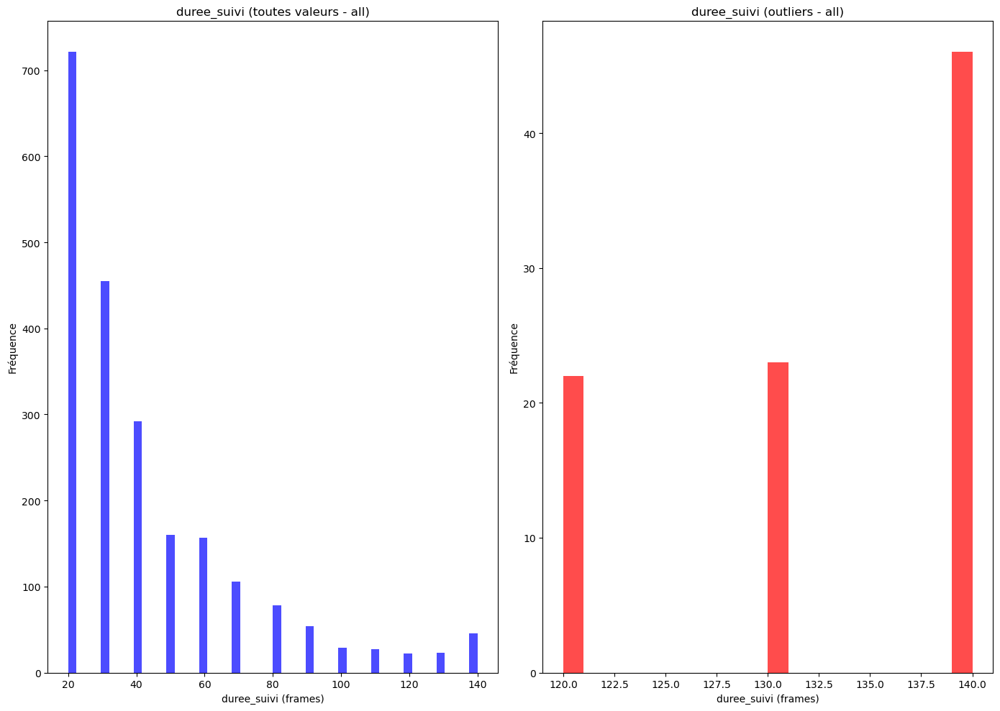

Index([ 284,  333,  605,  621,  777,  783,  964, 1026, 1164, 2104, 2459, 2864,
       2964, 3072, 3149, 3196, 3269, 3270, 3479, 3487, 3520, 3593, 3684, 3686,
       3754, 3895, 3970, 4411, 4506, 4676, 4748, 4951, 5472, 5677, 6079, 6121,
       6266, 6509, 6662, 6740, 6861, 6878, 6932, 6937, 7375, 7386, 7487, 7501,
       7503, 7663, 7737, 7813, 7844, 8040, 8127, 8135, 8170, 8262, 8323, 8330,
       8403, 8406, 8479, 8502, 8560, 8602, 8733, 8850, 8857, 8897, 8907, 8918,
       8968, 9067, 9115, 9184, 9287, 9361, 9441, 9447, 9462, 9648, 9657, 9670,
       9711, 9736, 9738, 9757, 9883, 9895, 9949],
      dtype='int64')
91


In [20]:
fig, axs = plt.subplots(1, 2, figsize=(14, 10))

# Toutes les valeurs - df_implemented_all
axs[0].hist(df_implemented_all['duree_suivi'], bins=50, color='blue', alpha=0.7)
axs[0].set_title("duree_suivi (toutes valeurs - all)")
axs[0].set_xlabel("duree_suivi (frames)")
axs[0].set_ylabel("Fréquence")

# Outliers - df_implemented_all
axs[1].hist(df_implemented_all[df_implemented_all['duree_suivi_outlier']]['duree_suivi'], bins=20, color='red', alpha=0.7)
axs[1].set_title("duree_suivi (outliers - all)")
axs[1].set_xlabel("duree_suivi (frames)")
axs[1].set_ylabel("Fréquence")

plt.tight_layout()
plt.show()

print(df_implemented_all[df_implemented_all['duree_suivi_outlier']][['duree_suivi']].index)
print(len(df_implemented_all[df_implemented_all['duree_suivi_outlier']]))

In [21]:
df_implemented_all = df_implemented_all[~df_implemented_all['duree_suivi_outlier']]

Une fois ce preprocessing terminé, on peut s'attaquer aux différentes questions d'intérêts présentes autour de ces données.

Mais avant de s'attaquer à ces questions, il faut créer un second dataframe excluant certaines données qui ne seront pas intéressante pour répondre à certaines questions précises. 

In [22]:
exclude_identifiers = ['C20250415_20250422-B2', 'C20250415_20250423-B1']
df_implemented_exclude = data_implementation_with_exclusion(
    df_implemented_all, 
    exclude_identifiers=exclude_identifiers
)

Identifiants à exclure: ['C20250415_20250422-B2', 'C20250415_20250423-B1']
Lignes exclues: 45


In [23]:
len(df_implemented_all), len(df_implemented_exclude)

(2079, 2034)

# Questions d'intérêts :

## Vitesse :

In [24]:
df_implemented_all['speed'] = df_implemented_all['tracks_smooth'].apply(calculer_vitesse)
df_implemented_exclude['speed'] = df_implemented_exclude['tracks_smooth'].apply(calculer_vitesse)

### Plot des vitesses et des métriques :

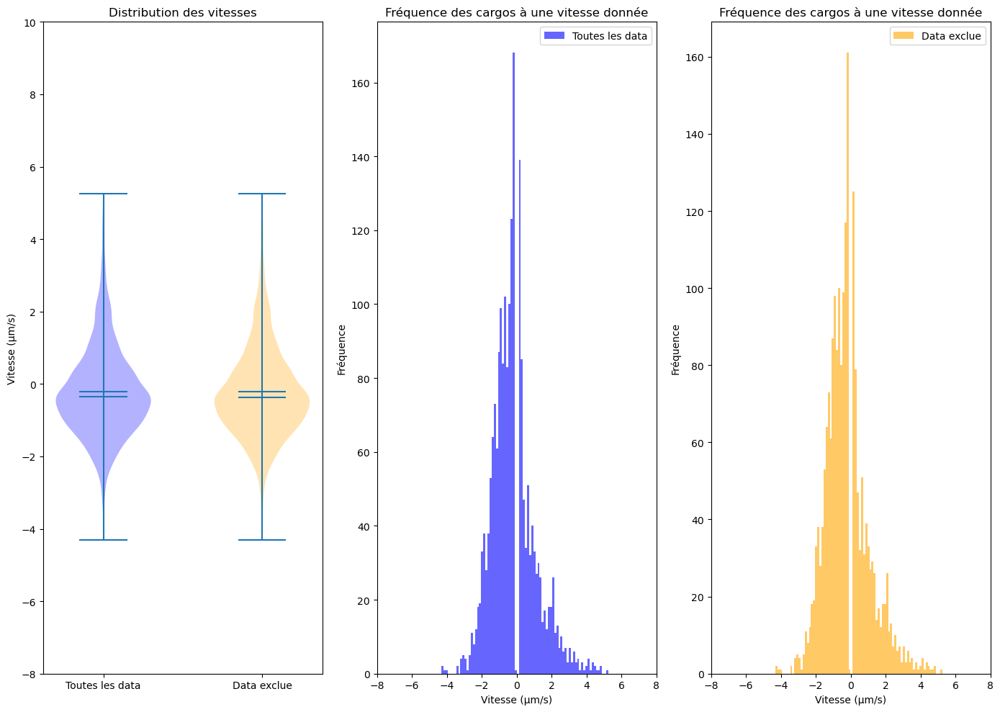

In [25]:
plt.figure(figsize=(14,10))
plt.subplot(1, 3, 1)

data = [df_implemented_all['speed'].dropna(), df_implemented_exclude['speed'].dropna()]
labels = ['Toutes les data', 'Data exclue']
violin = plt.violinplot(data, showmeans=True, showmedians=True, widths=0.6)
plt.xticks([1, 2], labels)
violin['bodies'][0].set_facecolor('blue')
violin['bodies'][1].set_facecolor('orange')
plt.ylabel('Vitesse (µm/s)')
plt.title('Distribution des vitesses')
plt.ylim(-8, 10)
plt.tight_layout()

plt.subplot(1, 3, 2)
plt.hist(df_implemented_all['speed'].dropna(), bins=80, alpha=0.6, label='Toutes les data', color='blue')
plt.xlabel('Vitesse (µm/s)')
plt.ylabel('Fréquence')
plt.title('Fréquence des cargos à une vitesse donnée')
plt.xlim(-8, 8)
plt.legend()
plt.tight_layout()

plt.subplot(1, 3, 3)
plt.hist(df_implemented_exclude['speed'].dropna(), bins=80, alpha=0.6, label='Data exclue', color='orange')
plt.xlabel('Vitesse (µm/s)')
plt.ylabel('Fréquence')
plt.title('Fréquence des cargos à une vitesse donnée')
plt.xlim(-8, 8)
plt.legend()
plt.tight_layout()


plt.show()

In [26]:
print("Statistiques sur les vitesses :")
print("Toutes les data :")
print(f"Vitesses non-nulles : {df_implemented_all['speed'].notna().sum()}", f"& Nombre de vitesse totales : {len(df_implemented_all['speed'])}")
print(f"Vitesse moyenne : {df_implemented_all['speed'].mean():.2f} µm/s")
print(f"Vitesse médiane : {df_implemented_all['speed'].median():.2f} µm/s")
print(f"Vitesse min : {df_implemented_all['speed'].min():.2f} µm/s", f"& vitesse max : {df_implemented_all['speed'].max():.2f} µm/s")
print("\nData avec partie exclue :")
print(f"Vitesses non-nulles : {df_implemented_exclude['speed'].notna().sum()}", f"& Nombre de vitesse totales : {len(df_implemented_exclude['speed'])}")
print(f"Vitesse moyenne : {df_implemented_exclude['speed'].mean():.2f} µm/s")
print(f"Vitesse médiane : {df_implemented_exclude['speed'].median():.2f} µm/s")
print(f"Vitesse min : {df_implemented_exclude['speed'].min():.2f} µm/s", f"& vitesse max : {df_implemented_exclude['speed'].max():.2f} µm/s")

Statistiques sur les vitesses :
Toutes les data :
Vitesses non-nulles : 2079 & Nombre de vitesse totales : 2079
Vitesse moyenne : -0.22 µm/s
Vitesse médiane : -0.35 µm/s
Vitesse min : -4.30 µm/s & vitesse max : 5.25 µm/s

Data avec partie exclue :
Vitesses non-nulles : 2034 & Nombre de vitesse totales : 2034
Vitesse moyenne : -0.22 µm/s
Vitesse médiane : -0.38 µm/s
Vitesse min : -4.30 µm/s & vitesse max : 5.25 µm/s


### Répartitions vitesses et signaux :

In [27]:
stats_vitesse_par_modalite(df_implemented_all, "Toutes les données")
stats_vitesse_par_modalite(df_implemented_exclude, "Données exclues")


Statistiques descriptives (Toutes les données) ---

Front d'onde (n=135)
  Moyenne : -0.02 µm/s
  Médiane : -0.13 µm/s
  Min     : -0.90 µm/s
  Max     : 1.30 µm/s
  Écart-type : 0.35 µm/s
  Quartiles : [-0.2500425  -0.13326667  0.20005   ]

Fluorescence (n=1944)
  Moyenne : -0.23 µm/s
  Médiane : -0.43 µm/s
  Min     : -4.30 µm/s
  Max     : 5.25 µm/s
  Écart-type : 1.30 µm/s
  Quartiles : [-1.075      -0.43328611  0.43331833]

Statistiques descriptives (Données exclues) ---

Front d'onde (n=90)
  Moyenne : -0.04 µm/s
  Médiane : -0.15 µm/s
  Min     : -0.90 µm/s
  Max     : 0.75 µm/s
  Écart-type : 0.31 µm/s
  Quartiles : [-0.24999375 -0.149975    0.19577321]

Fluorescence (n=1944)
  Moyenne : -0.23 µm/s
  Médiane : -0.43 µm/s
  Min     : -4.30 µm/s
  Max     : 5.25 µm/s
  Écart-type : 1.30 µm/s
  Quartiles : [-1.075      -0.43328611  0.43331833]


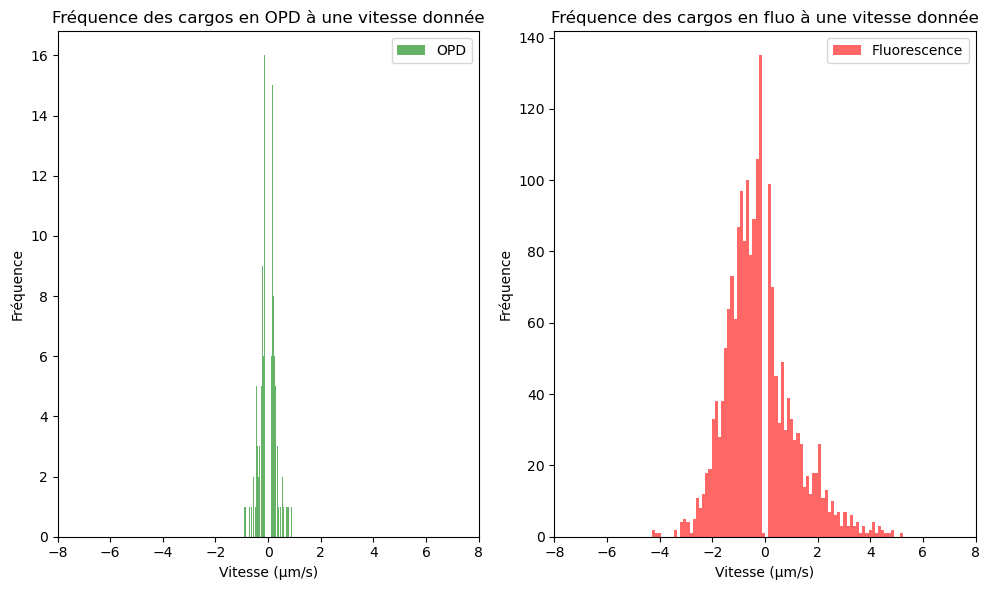

In [28]:
plt.figure(figsize=(10, 6))
plt.subplot(1, 2, 1)
opd_speeds_all = df_implemented_all[df_implemented_all['ID_modality'] == 1]['speed'].dropna()
fluo_speeds_all = df_implemented_all[df_implemented_all['ID_modality'] == 2]['speed'].dropna()

plt.hist(opd_speeds_all, bins=80, alpha=0.6, label='OPD', color='green')
plt.xlabel('Vitesse (µm/s)')
plt.ylabel('Fréquence')
plt.title('Fréquence des cargos en OPD à une vitesse donnée')
plt.xlim(-8, 8)
plt.legend()
plt.tight_layout()

plt.subplot(1, 2, 2)
plt.hist(fluo_speeds_all, bins=80, alpha=0.6, label='Fluorescence', color='red')
plt.xlabel('Vitesse (µm/s)')
plt.ylabel('Fréquence')
plt.title('Fréquence des cargos en fluo à une vitesse donnée')
plt.xlim(-8, 8)
plt.legend()
plt.tight_layout()

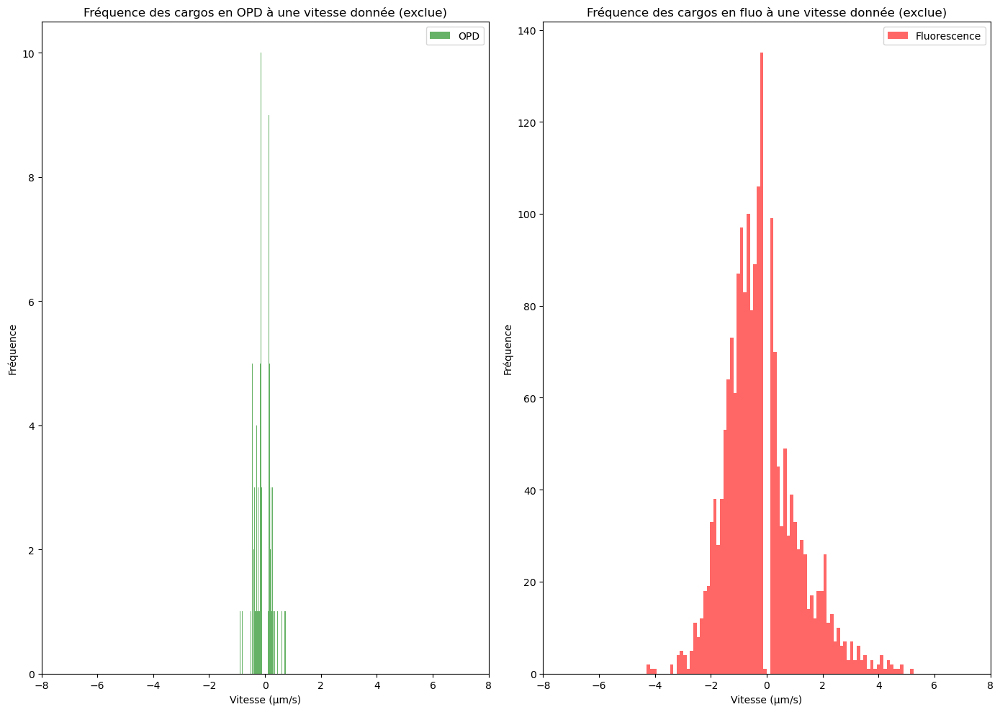

In [29]:
plt.figure(figsize=(14, 10))
plt.subplot(1, 2, 1)
opd_speeds_exclude = df_implemented_exclude[df_implemented_exclude['ID_modality'] == 1]['speed'].dropna()
fluo_speeds_exclude = df_implemented_exclude[df_implemented_exclude['ID_modality'] == 2]['speed'].dropna()

plt.hist(opd_speeds_exclude, bins=80, alpha=0.6, label='OPD', color='green')
plt.xlabel('Vitesse (µm/s)')
plt.ylabel('Fréquence')
plt.title('Fréquence des cargos en OPD à une vitesse donnée (exclue)')
plt.xlim(-8, 8)
plt.legend()
plt.tight_layout()

plt.subplot(1, 2, 2)
plt.hist(fluo_speeds_exclude, bins=80, alpha=0.6, label='Fluorescence', color='red')
plt.xlabel('Vitesse (µm/s)')
plt.ylabel('Fréquence')
plt.title('Fréquence des cargos en fluo à une vitesse donnée (exclue)')
plt.xlim(-8, 8)
plt.legend()
plt.tight_layout()

## Crossdétection :

In [30]:
df_implemented_exclude = nettoyer_crossdetection_object(df_implemented_exclude)

particules_crossdetectees(df_implemented_exclude)

Nombre de valeurs True: 141 et nombre de valeurs False : 1893
Nombre de particules: 2034
Nombre de particules crossdétectées: 141 (6.9%)


(                               ID_IDn                    ID_acqTag  ID_acqN  \
 48      C20250429_20250506-B6_ACQ0149  C20250429_20250506-B6_ACQ01        1   
 54      C20250429_20250506-B6_ACQ0155  C20250429_20250506-B6_ACQ01        1   
 80      C20250429_20250506-B6_ACQ0281  C20250429_20250506-B6_ACQ02        2   
 90      C20250429_20250506-B6_ACQ0291  C20250429_20250506-B6_ACQ02        2   
 95      C20250429_20250506-B6_ACQ0296  C20250429_20250506-B6_ACQ02        2   
 ...                               ...                          ...      ...   
 9443  C20250415_20250422-B5_ACQ212669  C20250415_20250422-B5_ACQ21       21   
 9453  C20250415_20250422-B5_ACQ212679  C20250415_20250422-B5_ACQ21       21   
 9558  C20250415_20250422-B5_ACQ222784  C20250415_20250422-B5_ACQ22       22   
 9750  C20250415_20250422-B5_ACQ252976  C20250415_20250422-B5_ACQ25       25   
 9832  C20250415_20250422-B5_ACQ263058  C20250415_20250422-B5_ACQ26       26   
 
       ID_modality                    

In [31]:
cross_detected_exclude, total_particules_exclude, nb_cross_exclude = particules_crossdetectees(df_implemented_exclude)

Nombre de particules: 2034
Nombre de particules crossdétectées: 141 (6.9%)


In [32]:
df_non_cross = df_implemented_exclude[df_implemented_exclude['crossdetection_bool_clean'] == False]

print("Répartition des particules non crossdétectées par modalité :")

opd_non_cross = df_non_cross[df_non_cross['ID_modality'] == 1]
fluo_non_cross = df_non_cross[df_non_cross['ID_modality'] == 2]

total_non_cross = len(df_non_cross)
nb_opd_non_cross = len(opd_non_cross)
nb_fluo_non_cross = len(fluo_non_cross)

pct_opd_non_cross = (nb_opd_non_cross / total_non_cross) * 100
pct_fluo_non_cross = (nb_fluo_non_cross / total_non_cross) * 100

print(f"Total particules non crossdétectées : {total_non_cross}")
print(f"OPD (modalité 1) : {nb_opd_non_cross} particules ({pct_opd_non_cross:.1f}%)")
print(f"Fluorescence (modalité 2) : {nb_fluo_non_cross} particules ({pct_fluo_non_cross:.1f}%)")

# Comparaison avec la répartition globale
print("\nComparaison avec la répartition globale :")

total_global = len(df_implemented_exclude)
opd_global = len(df_implemented_exclude[df_implemented_exclude['ID_modality'] == 1])
fluo_global = len(df_implemented_exclude[df_implemented_exclude['ID_modality'] == 2])

pct_opd_global = (opd_global / total_global) * 100
pct_fluo_global = (fluo_global / total_global) * 100

print(f"Répartition globale :")
print(f"OPD : {opd_global} particules ({pct_opd_global:.1f}%)")
print(f"Fluorescence : {fluo_global} particules ({pct_fluo_global:.1f}%)")

# Calculer l'enrichissement/appauvrissement
enrichissement_opd = pct_opd_non_cross / pct_opd_global
enrichissement_fluo = pct_fluo_non_cross / pct_fluo_global

print(f"\Comparaison à la population globale :")
print(f"OPD : {enrichissement_opd:.2f}x (par rapport à la population globale)")
print(f"Fluorescence : {enrichissement_fluo:.2f}x (par rapport à la population globale)")

Répartition des particules non crossdétectées par modalité :
Total particules non crossdétectées : 1893
OPD (modalité 1) : 81 particules (4.3%)
Fluorescence (modalité 2) : 1812 particules (95.7%)

Comparaison avec la répartition globale :
Répartition globale :
OPD : 90 particules (4.4%)
Fluorescence : 1944 particules (95.6%)
\Comparaison à la population globale :
OPD : 0.97x (par rapport à la population globale)
Fluorescence : 1.00x (par rapport à la population globale)


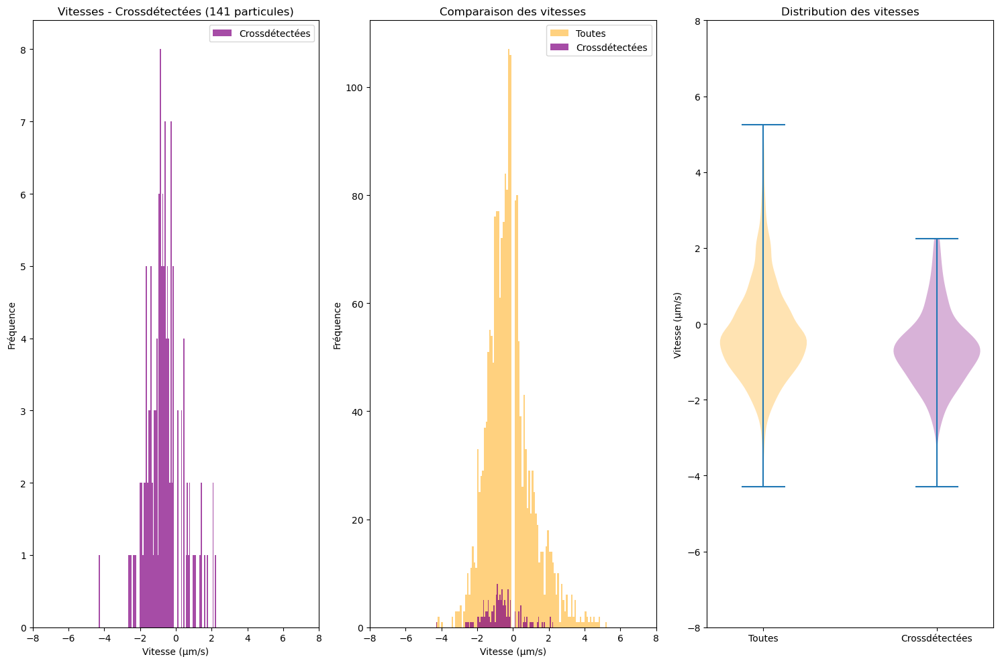

In [33]:
fig, axes = plt.subplots(1, 3, figsize=(15, 10))

# Particules crossdétectées
axes[0].hist(cross_detected_exclude['speed'].dropna(), bins=100, alpha=0.7, color='purple', label='Crossdétectées')
axes[0].set_title(f'Vitesses - Crossdétectées ({nb_cross_exclude} particules)')
axes[0].set_xlabel('Vitesse (µm/s)')
axes[0].set_ylabel('Fréquence')
axes[0].set_xlim(-8, 8)
axes[0].legend()

# Particules crossdétectées et non-crossdétectées
axes[1].hist(df_implemented_exclude['speed'].dropna(), bins=100, alpha=0.5, label='Toutes', color='orange')
axes[1].hist(cross_detected_exclude['speed'].dropna(), bins=100, alpha=0.7, label='Crossdétectées', color='purple')
axes[1].set_title('Comparaison des vitesses')
axes[1].set_xlabel('Vitesse (µm/s)')
axes[1].set_ylabel('Fréquence')
axes[1].set_xlim(-8, 8)
axes[1].legend()

# Comparaison 
data_box = [df_implemented_exclude['speed'].dropna(), cross_detected_exclude['speed'].dropna()]
violinplot = axes[2].violinplot(data_box)
axes[2].set_xticks([1, 2])
axes[2].set_xticklabels(['Toutes', 'Crossdétectées'])
violinplot['bodies'][0].set_facecolor('orange')
violinplot['bodies'][1].set_facecolor('purple')
axes[2].set_title('Distribution des vitesses')
axes[2].set_ylabel('Vitesse (µm/s)')
axes[2].set_ylim(-8, 8)

plt.tight_layout()
plt.show()

In [34]:
print(métriques_crossdétectées(df_implemented_exclude, cross_detected_exclude))

                      Toutes  Crossdétectées
Nombre           2034.000000      141.000000
Vitesse moyenne    -0.222073       -0.656216
Vitesse médiane    -0.380040       -0.716683
Vitesse min        -4.300000       -4.300000
Vitesse max         5.249900        2.250000
Écart-type          1.277893        1.010349


## Cargo faisant demi-tours : 

In [35]:
df_implemented_exclude['demi_tour'] = df_implemented_exclude['tracks_smooth'].apply(detecter_demi_tour)
demi_tour_exclude = df_implemented_exclude[df_implemented_exclude['demi_tour'] == True]
print(f'Nombre de cargos qui font demi-tour (exclu): {len(demi_tour_exclude)} sur {len(df_implemented_exclude)} ({len(demi_tour_exclude)/len(df_implemented_exclude)*100:.1f}%)')

Nombre de cargos qui font demi-tour (exclu): 140 sur 2034 (6.9%)


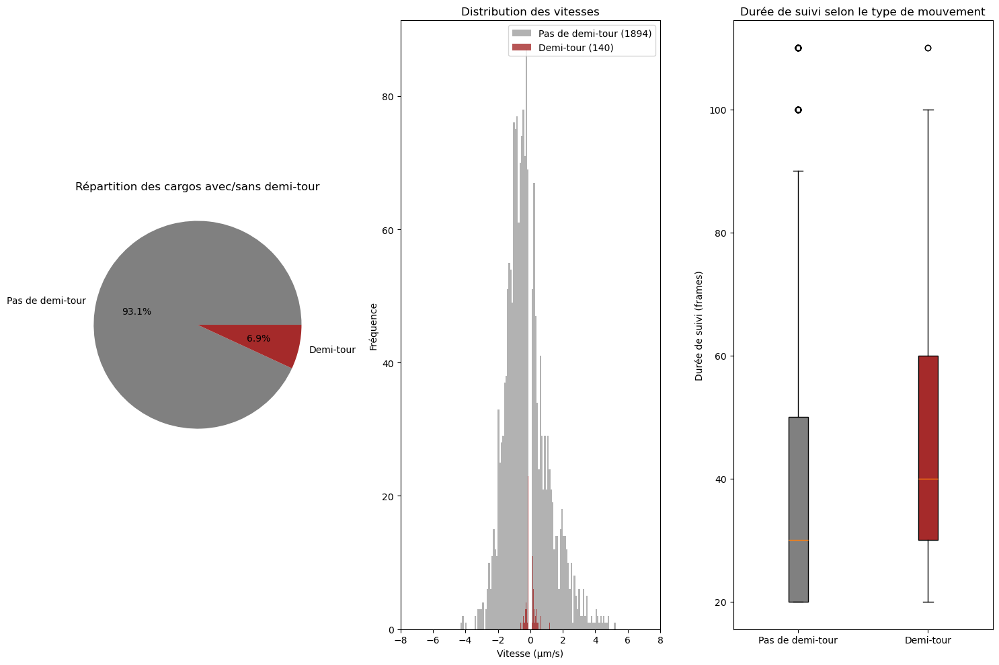

In [36]:
fig, axes = plt.subplots(1, 3, figsize=(15, 10))

# Répartition demi-tours / normal
demi_tour_counts = df_implemented_exclude['demi_tour'].value_counts()
axes[0].pie(demi_tour_counts.values, labels=['Pas de demi-tour', 'Demi-tour'], 
              autopct='%1.1f%%', colors=['grey', 'brown'])
axes[0].set_title('Répartition des cargos avec/sans demi-tour')

# Vitesses - demi-tours vs normaux
df_normal = df_implemented_exclude[df_implemented_exclude['demi_tour'] == False]
df_demi_tour = df_implemented_exclude[df_implemented_exclude['demi_tour'] == True]

axes[1].hist(df_normal['speed'].dropna(), bins=100, alpha=0.6, 
               label=f'Pas de demi-tour ({len(df_normal)})', color='grey')
if len(df_demi_tour) > 0:
    axes[1].hist(df_demi_tour['speed'].dropna(), bins=100, alpha=0.8, 
                   label=f'Demi-tour ({len(df_demi_tour)})', color='brown')
axes[1].set_xlabel('Vitesse (µm/s)')
axes[1].set_ylabel('Fréquence')
axes[1].set_title('Distribution des vitesses')
axes[1].set_xlim(-8, 8)
axes[1].legend()

# Durée de suivi vs demi-tours
box_plot = axes[2].boxplot([df_normal['duree_suivi'].dropna(), 
                           df_demi_tour['duree_suivi'].dropna()], 
                          labels=['Pas de demi-tour', 'Demi-tour'], 
                          patch_artist=True)

# Définir les couleurs après création
box_plot['boxes'][0].set_facecolor('grey')
if len(box_plot['boxes']) > 1:
    box_plot['boxes'][1].set_facecolor('brown')

axes[2].set_ylabel('Durée de suivi (frames)')
axes[2].set_title('Durée de suivi selon le type de mouvement')

plt.tight_layout()
plt.show()

Répartition :
Normal: 1894 (93.1%)
Demi-tour : 140 (6.9%)


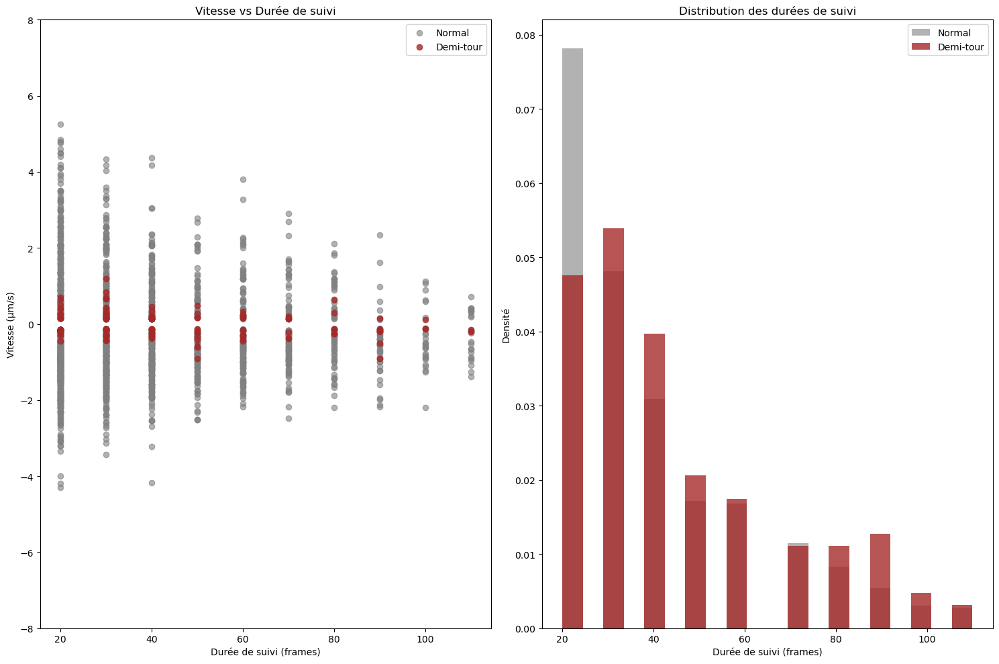


Statistiques comparatives :
Métrique        Normal (moy) Demi-tour (moy) Différence
------------------------------------------------------------
speed           -0.24        -0.01           -95.8     %
duree_suivi     39.06        44.43           13.7      %
nb_points       4.91         5.44            10.9      %


In [37]:
analyser_demi_tours_statistiques(df_implemented_exclude)

## Seuil intensité signal pour crossdétection :

In [38]:
seuil_OPD = seuil_signal_dispersion(df_implemented_exclude, quantile_signal=0.5, quantile_dispersion=0.5, modalite=1)

Calcul du seuil pour OPD (Front d'onde) (90 particules sur 2034 total)
Seuil signal_I (quantile 0.5): 9.16
Seuil dispersion (quantile 0.5): 3.17
Seuil ratio signal/dispersion: 2.89


Analyse sur 90 particules OPD (sur 2034 total)

Résultats (OPD uniquement):
OPD faible (≤2.89): 0/0 crossdétectées (0.0%)
OPD fort (>2.89): 9/90 crossdétectées (10.0%)


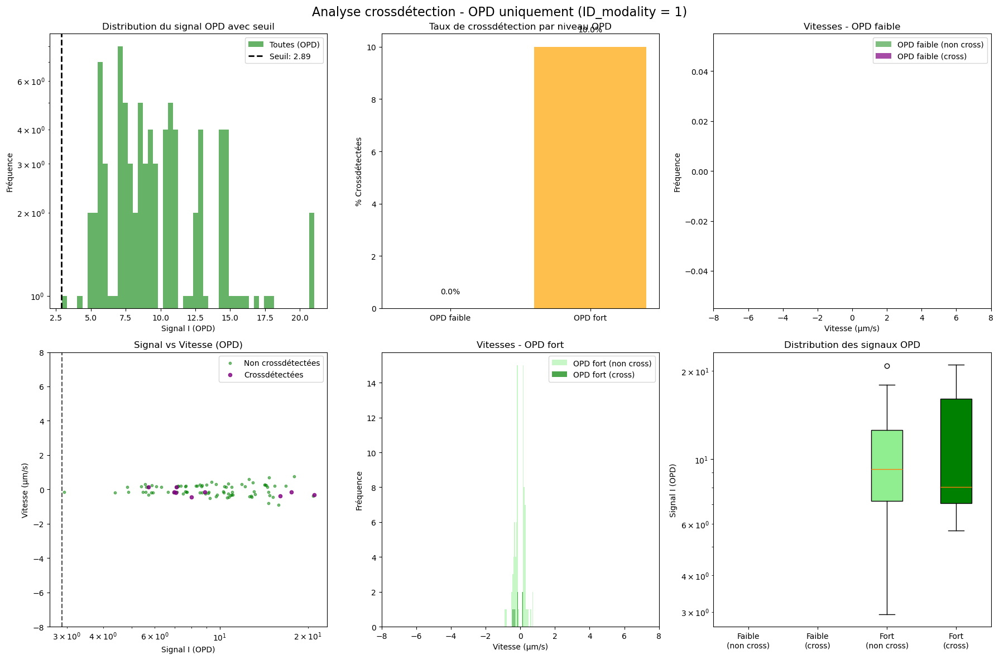


Statistiques détaillées (OPD uniquement):
Catégorie            Total      Crossdét.    %        Signal moy.  Vitesse moy.
--------------------------------------------------------------------------------
OPD faible           0          0            0.0      nan          nan         
OPD fort             90         9            10.0     9.94         -0.04       

Test Mann-Whitney vitesse OPD faible vs OPD fort : U=nan, p=nan
Pas de différence significative (p ≥ 0.05)


In [39]:
resultats_crossdetected_OPD = analyser_crossdetection_par_signal_OPD(df_implemented_exclude, seuil_signal=seuil_OPD)

In [40]:
seuil_Fluo = seuil_signal_dispersion(df_implemented_exclude, quantile_signal=0.5, quantile_dispersion=0.5, modalite=2)

Calcul du seuil pour Fluorescence (1944 particules sur 2034 total)
Seuil signal_I (quantile 0.5): 90.12
Seuil dispersion (quantile 0.5): 11.61
Seuil ratio signal/dispersion: 7.76


Analyse sur 1944 particules Fluo (sur 2034 total)

Résultats (Fluo uniquement):
Fluo faible (≤7.76): 0/0 crossdétectées (0.0%)
Fluo fort (>7.76): 132/1944 crossdétectées (6.8%)


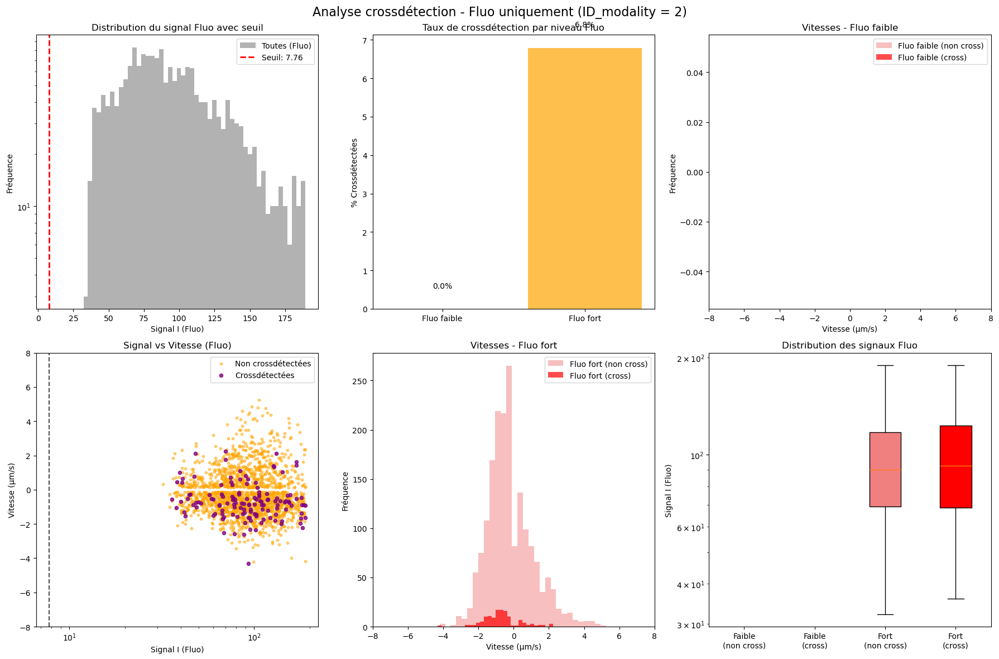


Statistiques détaillées (Fluo uniquement):
Catégorie            Total      Crossdét.    %        Signal moy.  Vitesse moy.
--------------------------------------------------------------------------------
Fluo faible          0          0            0.0      nan          nan         
Fluo fort            1944       132          6.8      95.55        -0.23       

Test Mann-Whitney vitesse Fluo faible vs Fluo fort : U=nan, p=nan
Pas de différence significative (p ≥ 0.05)


In [41]:
resultats_crossdetected_Fluo = analyser_crossdetection_par_signal_Fluo(df_implemented_exclude, seuil_signal=seuil_Fluo)

## Impact de la longueur de détection sur la précision de détection :

In [42]:
df_cross_exclude = df_implemented_exclude[df_implemented_exclude['crossdetection_bool_clean'] == True]

df_non_cross_exclude = df_implemented_exclude[df_implemented_exclude['crossdetection_bool_clean'] == False]

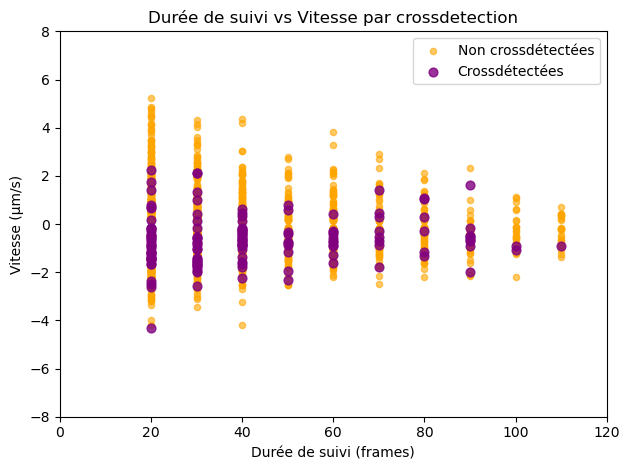

In [43]:

plt.scatter(df_non_cross_exclude['duree_suivi'], df_non_cross_exclude['speed'], 
                alpha=0.6, label='Non crossdétectées', color='orange', s=20)
plt.scatter(df_cross_exclude['duree_suivi'], df_cross_exclude['speed'], 
                alpha=0.8, label='Crossdétectées', color='purple', s=40)
plt.xlabel('Durée de suivi (frames)')
plt.ylabel('Vitesse (µm/s)')
plt.ylim(-8, 8)
plt.xlim(0, df_implemented_exclude['duree_suivi'].max() + 10)
plt.title('Durée de suivi vs Vitesse par crossdetection')
plt.legend()

plt.tight_layout()
plt.show()

# Séparation des cargo faisant demi-tour pour analyse :

Le but est de tester une ou plusieurs méthodes d'analyses pour savoir si les cargo qui font demi-tour forment un groupe distinct des cargo ne faisant pas demi-tour.

## Analyse non supervisée par PCA

In [44]:
features = ['speed', 'duree_suivi', 'nb_points', 'signal_I', 'ID_modality']

pca = df_implemented_exclude.dropna(subset = features + ['demi_tour'])

X = pca[features].values
y = pca['demi_tour'].values

X_scaled = StandardScaler().fit_transform(X)

pca_model = PCA(n_components=2)
X_pca = pca_model.fit_transform(X_scaled)

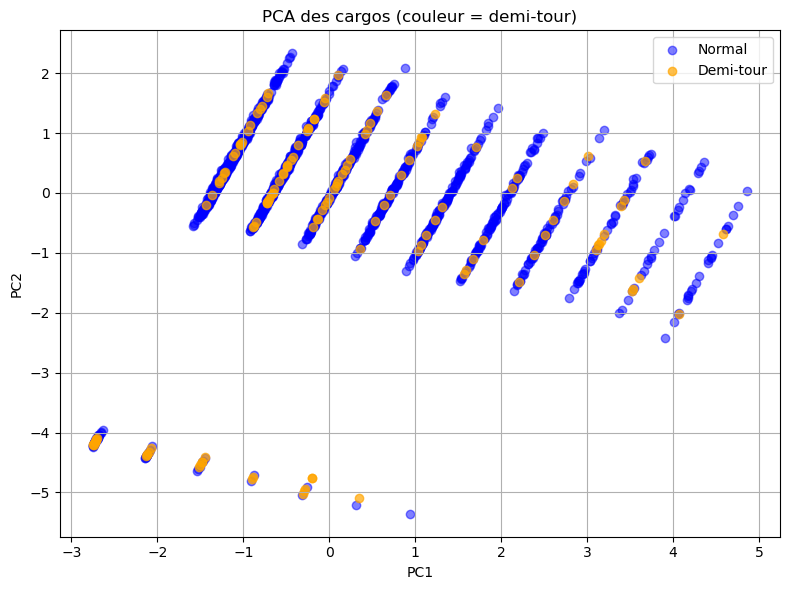

Variance expliquée par PC1 et PC2 : [0.41554855 0.27787755]


In [45]:
plt.figure(figsize=(8,6))
plt.scatter(X_pca[y==0, 0], X_pca[y==0, 1], alpha=0.5, label='Normal', color='blue')
plt.scatter(X_pca[y==1, 0], X_pca[y==1, 1], alpha=0.7, label='Demi-tour', color='orange')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('PCA des cargos (couleur = demi-tour)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

print("Variance expliquée par PC1 et PC2 :", pca_model.explained_variance_ratio_)

La sélection des variables ne permet pas de séparer les groupes, mais au vu du dataset et des informations, on ne peut pas sélectionner d'autres variables. 

## Test avec UMAP pour répondre à l'analyse

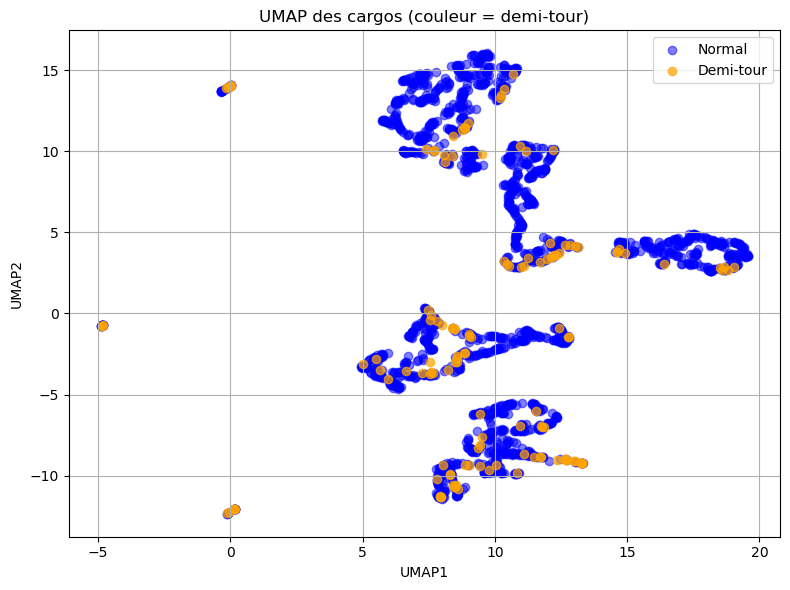

In [46]:
features_umap = ['speed', 'duree_suivi', 'nb_points', 'signal_I']
umap_data = df_implemented_exclude.dropna(subset=features_umap + ['demi_tour'])

X_umap = umap_data[features_umap].values
y_umap = umap_data['demi_tour'].values

X_scaled_umap = StandardScaler().fit_transform(X_umap)

umap_model = umap.UMAP(n_components=2, random_state=42)
X_umap = umap_model.fit_transform(X_scaled_umap)

plt.figure(figsize=(8,6))
plt.scatter(X_umap[y_umap==0, 0], X_umap[y_umap==0, 1], alpha=0.5, label='Normal', color='blue')
plt.scatter(X_umap[y_umap==1, 0], X_umap[y_umap==1, 1], alpha=0.7, label='Demi-tour', color='orange')
plt.xlabel('UMAP1')
plt.ylabel('UMAP2')
plt.title('UMAP des cargos (couleur = demi-tour)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

## Conclusion :

Quelque soit l'analyse (PCA, UMAP, t-SNE, ...)réalisée pour savoir si les cargo faisant demi-tour forment un groupe distinct et quelques soient les features (et leur ordre) testées, le résultat est toujours négatifs. Cela signgifie que les cargo faisant et ne faisant pas demi-tour ne peuvent pas être discernée par en ensemble de features et les techniques d'enregistrement utilisée à l'heure actuelle.

# S'intéresser à la fluorescence et au front d'onde et au signal :

In [47]:
"""colonnes_requises = ['ID_modality', 'signal_I', 'signal_sigma']
colonnes_presentes = [col for col in colonnes_requises if col in df_implemented_exclude.columns]
colonnes_manquantes = [col for col in colonnes_requises if col not in df_implemented_exclude.columns]
"""

# Statistiques des modalités
if 'ID_modality' in df_implemented_exclude.columns:
    print(f"\nRépartition des modalités :")
    modalite_counts = df_implemented_exclude['ID_modality'].value_counts().sort_index()
    print(modalite_counts)

    modalite_pct = df_implemented_exclude['ID_modality'].value_counts(normalize=True).sort_index() * 100
    print(f"\nPourcentages:")
    for modalite, pct in modalite_pct.items():
        nom_modalite = "Front d'onde" if modalite == 1 else "Fluorescence" if modalite == 2 else f"Modalité {modalite}"
        print(f"  {modalite} ({nom_modalite}): {pct:.1f}%")

# Vérification de la qualité du signal selon les critères
if all(col in df_implemented_exclude.columns for col in ['signal_I', 'signal_sigma']):
    print(f"\nAnalyse de la qualité du signal selon les critères :")
    
    # Critères de fiabilité
    signal_positif = df_implemented_exclude['signal_I'] > 0
    sigma_petit = df_implemented_exclude['signal_sigma'] <= df_implemented_exclude['signal_I']  # sigma de l'ordre de grandeur du signal
    duree_suffisante = df_implemented_exclude['duree_suivi'] > 1.0  # Plus d'1 seconde

    # Signal fiable selon tous les critères
    signal_fiable = signal_positif & sigma_petit & duree_suffisante

    print(f"Signal positif: {signal_positif.sum()} / {len(df_implemented_exclude)} ({signal_positif.mean()*100:.3f}%)")
    print(f"Sigma petit (≤ signal): {sigma_petit.sum()} / {len(df_implemented_exclude)} ({sigma_petit.mean()*100:.3f}%)")
    print(f"Durée suffisante (>1s): {duree_suffisante.sum()} / {len(df_implemented_exclude)} ({duree_suffisante.mean()*100:.3f}%)")
    print(f"Signal fiable (tous critères): {signal_fiable.sum()} / {len(df_implemented_exclude)} ({signal_fiable.mean()*100:.3f}%)")


Répartition des modalités :
ID_modality
1      90
2    1944
Name: count, dtype: int64

Pourcentages:
  1 (Front d'onde): 4.4%
  2 (Fluorescence): 95.6%

Analyse de la qualité du signal selon les critères :
Signal positif: 2034 / 2034 (100.000%)
Sigma petit (≤ signal): 1965 / 2034 (96.608%)
Durée suffisante (>1s): 2034 / 2034 (100.000%)
Signal fiable (tous critères): 1965 / 2034 (96.608%)


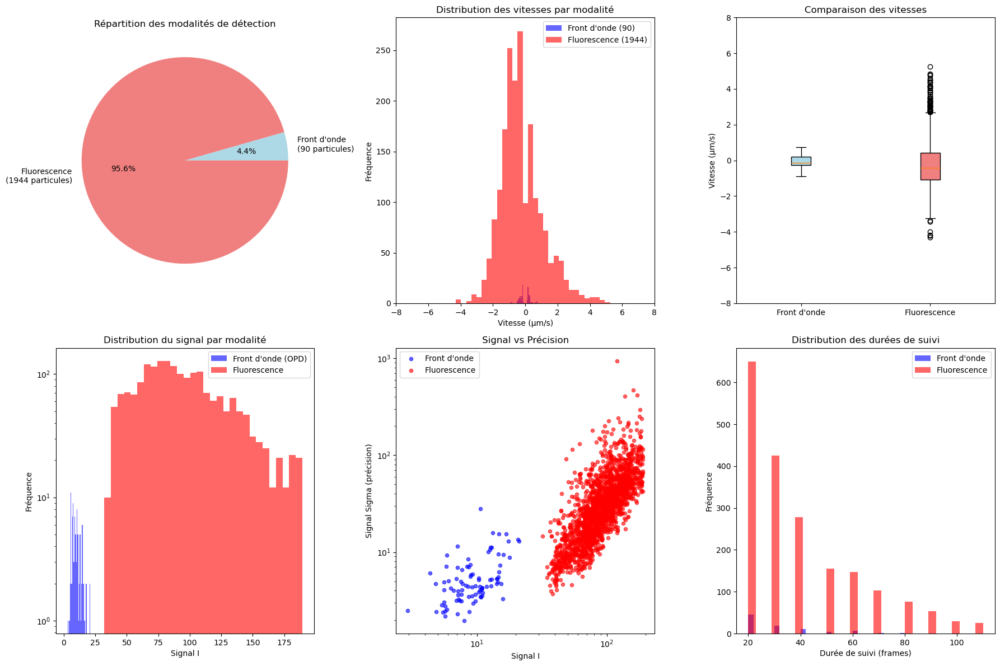

In [48]:
if 'ID_modality' in df_implemented_exclude.columns:
    # Séparer les données par modalité
    df_front_onde = df_implemented_exclude[df_implemented_exclude['ID_modality'] == 1]
    df_fluorescence = df_implemented_exclude[df_implemented_exclude['ID_modality'] == 2]

    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    
    # Répartition des modalités
    modalite_counts = df_implemented_exclude['ID_modality'].value_counts().sort_index()
    axes[0,0].pie(modalite_counts.values, 
                  labels=[f"Front d'onde\n({modalite_counts[1]} particules)", 
                          f"Fluorescence\n({modalite_counts[2]} particules)"], 
                  autopct='%1.1f%%', colors=['lightblue', 'lightcoral'])
    axes[0,0].set_title('Répartition des modalités de détection')
    
    # Distribution des vitesses par modalité
    axes[0,1].hist(df_front_onde['speed'].dropna(), bins=30, alpha=0.6, 
                   label=f"Front d'onde ({len(df_front_onde)})", color='blue')
    axes[0,1].hist(df_fluorescence['speed'].dropna(), bins=30, alpha=0.6, 
                   label=f"Fluorescence ({len(df_fluorescence)})", color='red')
    axes[0,1].set_xlabel('Vitesse (µm/s)')
    axes[0,1].set_ylabel('Fréquence')
    axes[0,1].set_xlim(-8, 8)
    axes[0,1].set_title('Distribution des vitesses par modalité')
    axes[0,1].legend()
    
    # Boxplot des vitesses
    vitesses_par_modalite = [df_front_onde['speed'].dropna(), 
                            df_fluorescence['speed'].dropna()]
    box_plot = axes[0,2].boxplot(vitesses_par_modalite, 
                                labels=["Front d'onde", "Fluorescence"], 
                                patch_artist=True)
    box_plot['boxes'][0].set_facecolor('lightblue')
    box_plot['boxes'][1].set_facecolor('lightcoral')
    axes[0,2].set_ylim(-8, 8)
    axes[0,2].set_ylabel('Vitesse (µm/s)')
    axes[0,2].set_title('Comparaison des vitesses')
    
    # Distribution du signal_I par modalité
    if 'signal_I' in df_implemented_exclude.columns:
        axes[1,0].hist(df_front_onde['signal_I'].dropna(), bins=30, alpha=0.6, 
                       label="Front d'onde (OPD)", color='blue')
        axes[1,0].hist(df_fluorescence['signal_I'].dropna(), bins=30, alpha=0.6, 
                       label="Fluorescence", color='red')
        axes[1,0].set_xlabel('Signal I')
        axes[1,0].set_ylabel('Fréquence')
        axes[1,0].set_title('Distribution du signal par modalité')
        axes[1,0].legend()
        axes[1,0].set_yscale('log')  # Échelle log pour mieux voir les distributions
    
    # Relation signal vs sigma
    if all(col in df_implemented_exclude.columns for col in ['signal_I', 'signal_sigma']):
        axes[1,1].scatter(df_front_onde['signal_I'], df_front_onde['signal_sigma'], 
                         alpha=0.6, label="Front d'onde", color='blue', s=20)
        axes[1,1].scatter(df_fluorescence['signal_I'], df_fluorescence['signal_sigma'], 
                         alpha=0.6, label="Fluorescence", color='red', s=20)
        axes[1,1].set_xlabel('Signal I')
        axes[1,1].set_ylabel('Signal Sigma (précision)')
        axes[1,1].set_title('Signal vs Précision')
        axes[1,1].legend()
        axes[1,1].set_yscale('log')
        axes[1,1].set_xscale('log')
    
    # Durée de suivi par modalité
    axes[1,2].hist(df_front_onde['duree_suivi'].dropna(), bins=30, alpha=0.6, 
                   label="Front d'onde", color='blue')
    axes[1,2].hist(df_fluorescence['duree_suivi'].dropna(), bins=30, alpha=0.6, 
                   label="Fluorescence", color='red')
    axes[1,2].set_xlabel('Durée de suivi (frames)')
    axes[1,2].set_ylabel('Fréquence')
    axes[1,2].set_title('Distribution des durées de suivi')
    axes[1,2].legend()
    
    plt.tight_layout()
    plt.show()


FRONT D'ONDE (90 particules):
Signal positif: 90 (100.0%)
Sigma ≤ Signal: 83 (92.2%)
Durée > 1s: 90 (100.0%)
Fiable (tous critères): 83 (92.2%)
Fiable (signal + durée): 90 (100.0%)
Vitesse moyenne (fiable): -0.05 µm/s
Signal moyen (fiable): 10.04

FLUORESCENCE (1944 particules):
Signal positif: 1944 (100.0%)
Sigma ≤ Signal: 1882 (96.8%)
Durée > 1s: 1944 (100.0%)
Fiable (tous critères): 1882 (96.8%)
Fiable (signal + durée): 1944 (100.0%)
Vitesse moyenne (fiable): -0.24 µm/s
Signal moyen (fiable): 95.02


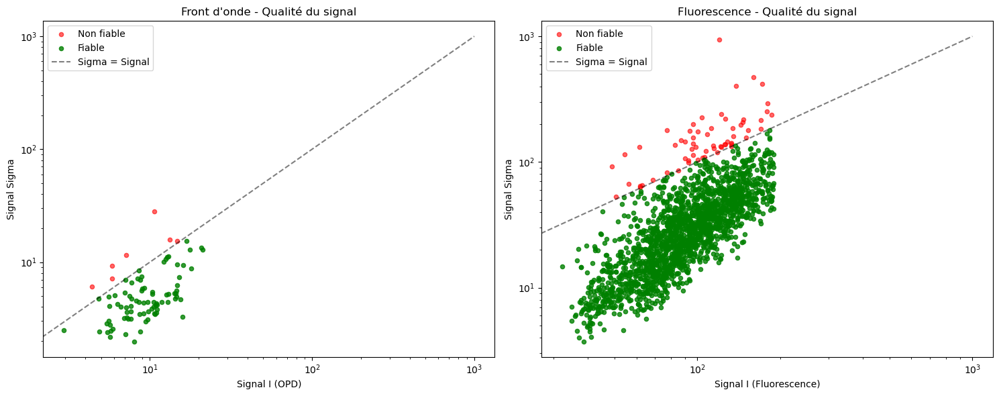

In [49]:
# Analyser chaque modalité
df_front_onde = df_implemented_exclude[df_implemented_exclude['ID_modality'] == 1]
df_fluorescence = df_implemented_exclude[df_implemented_exclude['ID_modality'] == 2]

fiable_front = analyser_qualite_signal(df_front_onde, "Front d'onde")
fiable_fluo = analyser_qualite_signal(df_fluorescence, "Fluorescence")

# Graphique de la qualité
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Données fiables vs non fiables - Front d'onde
df_front_fiable = df_front_onde[fiable_front]
df_front_non_fiable = df_front_onde[~fiable_front]

axes[0].scatter(df_front_non_fiable['signal_I'], df_front_non_fiable['signal_sigma'], 
                alpha=0.6, color='red', label='Non fiable', s=20)
axes[0].scatter(df_front_fiable['signal_I'], df_front_fiable['signal_sigma'], 
                alpha=0.8, color='green', label='Fiable', s=20)
axes[0].plot([0, 1000], [0, 1000], 'k--', alpha=0.5, label='Sigma = Signal')
axes[0].set_xlabel('Signal I (OPD)')
axes[0].set_ylabel('Signal Sigma')
axes[0].set_title("Front d'onde - Qualité du signal")
axes[0].legend()
axes[0].set_xscale('log')
axes[0].set_yscale('log')

# Données fiables vs non fiables - Fluorescence
df_fluo_fiable = df_fluorescence[fiable_fluo]
df_fluo_non_fiable = df_fluorescence[~fiable_fluo]

axes[1].scatter(df_fluo_non_fiable['signal_I'], df_fluo_non_fiable['signal_sigma'], 
                alpha=0.6, color='red', label='Non fiable', s=20)
axes[1].scatter(df_fluo_fiable['signal_I'], df_fluo_fiable['signal_sigma'], 
                alpha=0.8, color='green', label='Fiable', s=20)
axes[1].plot([0, 1000], [0, 1000], 'k--', alpha=0.5, label='Sigma = Signal')
axes[1].set_xlabel('Signal I (Fluorescence)')
axes[1].set_ylabel('Signal Sigma')
axes[1].set_title("Fluorescence - Qualité du signal")
axes[1].legend()
axes[1].set_xscale('log')
axes[1].set_yscale('log')

plt.tight_layout()
plt.show()

In [50]:
print("Comparaison des modalités")

if 'ID_modality' in df_implemented_exclude.columns:
    df_front_onde = df_implemented_exclude[df_implemented_exclude['ID_modality'] == 1]
    df_fluorescence = df_implemented_exclude[df_implemented_exclude['ID_modality'] == 2]

    print(f"Répartition :")
    print(f"OPD : {len(df_front_onde)} particules ({len(df_front_onde)/len(df_implemented_exclude)*100:.1f}%)")
    print(f"Fluorescence : {len(df_fluorescence)} particules ({len(df_fluorescence)/len(df_implemented_exclude)*100:.1f}%)")

    print(f"\nVitesse :")
    print(f"Front d'onde : {df_front_onde['speed'].mean():.2f} ± {df_front_onde['speed'].std():.2f} µm/s")
    print(f"Fluorescence : {df_fluorescence['speed'].mean():.2f} ± {df_fluorescence['speed'].std():.2f} µm/s")

    print(f"\nDurées de suivi :")
    print(f"Front d'onde : {df_front_onde['duree_suivi'].mean():.2f} ± {df_front_onde['duree_suivi'].std():.2f} s")
    print(f"Fluorescence : {df_fluorescence['duree_suivi'].mean():.2f} ± {df_fluorescence['duree_suivi'].std():.2f} s")

    if 'signal_I' in df_implemented_exclude.columns:
        print(f"\nSignaux :")
        front_signal_pos = (df_front_onde['signal_I'] > 0).mean() * 100
        fluo_signal_pos = (df_fluorescence['signal_I'] > 0).mean() * 100
        print(f"Front d'onde - Signal positif : {front_signal_pos:.1f}%")
        print(f"Fluorescence - Signal positif : {fluo_signal_pos:.1f}%")
    
    # Test statistique sur les vitesses
    u_stat, p_value = stats.ttest_ind(df_front_onde['speed'].dropna(), 
                                    df_fluorescence['speed'].dropna())
    print(f"\nTest stat vitesse :")
    print(f"u-statistic (Mann-Whitney): {u_stat:.3f}")
    print(f"p-value: {p_value:.3f}")
    if p_value < 0.05:
        print("Différence significative entre les modalités (p < 0.05)")
    else:
        print("Pas de différence significative")

Comparaison des modalités
Répartition :
OPD : 90 particules (4.4%)
Fluorescence : 1944 particules (95.6%)

Vitesse :
Front d'onde : -0.04 ± 0.31 µm/s
Fluorescence : -0.23 ± 1.30 µm/s

Durées de suivi :
Front d'onde : 30.78 ± 14.71 s
Fluorescence : 39.83 ± 22.22 s

Signaux :
Front d'onde - Signal positif : 100.0%
Fluorescence - Signal positif : 100.0%

Test stat vitesse :
u-statistic (Mann-Whitney): 1.350
p-value: 0.177
Pas de différence significative


Analyse du signal de fluorescence des particules crossdétectées
Répartition en fluorescence:
Total particules fluorescence : 1944
Crossdétectées : 132 (6.8%)
Non crossdétectées : 1812 (93.2%)

Signaux de fluorescence:
Signal moyen (crossdétectées) : 98.26
Signal moyen (non crossdétectées) : 95.35
Signal médian (crossdétectées) : 92.50
Signal médian (non crossdétectées) : 89.92
Ratio signal (cross/non-cross): 1.03x


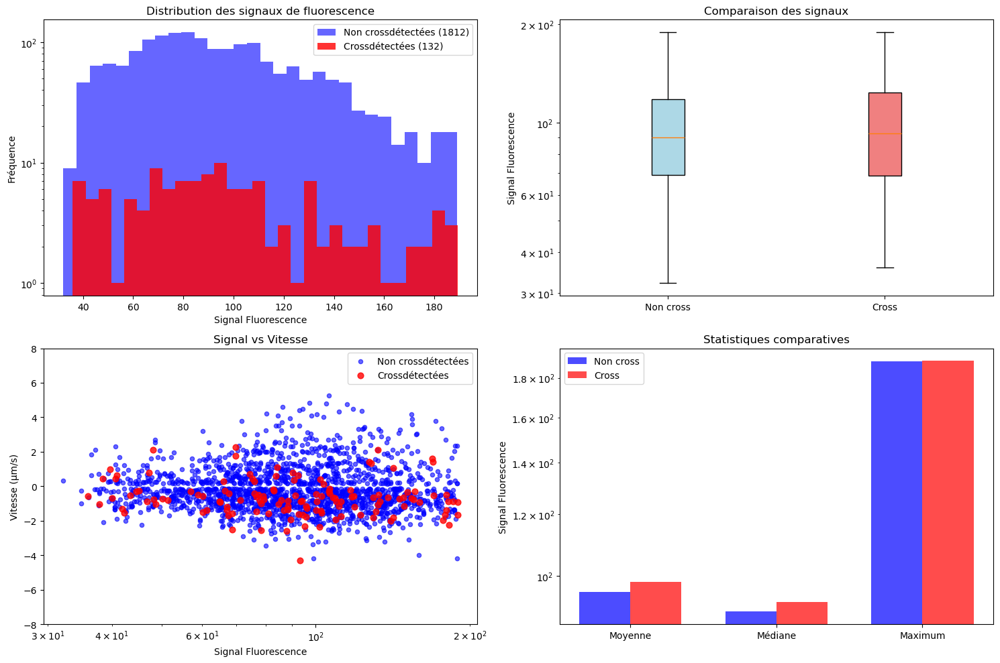

In [51]:
print("Analyse du signal de fluorescence des particules crossdétectées")

# Vérifier que nous avons toutes les colonnes nécessaires
colonnes_necessaires = ['crossdetection_bool_clean', 'ID_modality', 'signal_I']
colonnes_presentes = [col for col in colonnes_necessaires if col in df_implemented_exclude.columns]

if len(colonnes_presentes) == len(colonnes_necessaires):
    
    # Séparer les données de fluorescence
    df_fluorescence = df_implemented_exclude[df_implemented_exclude['ID_modality'] == 2]  # Modalité 2 = Fluorescence
    
    if len(df_fluorescence) > 0:
        # Particules crossdétectées en fluorescence
        df_fluo_cross = df_fluorescence[df_fluorescence['crossdetection_bool_clean'] == True]
        df_fluo_non_cross = df_fluorescence[df_fluorescence['crossdetection_bool_clean'] == False]

        print(f"Répartition en fluorescence:")
        print(f"Total particules fluorescence : {len(df_fluorescence)}")
        print(f"Crossdétectées : {len(df_fluo_cross)} ({len(df_fluo_cross)/len(df_fluorescence)*100:.1f}%)")
        print(f"Non crossdétectées : {len(df_fluo_non_cross)} ({len(df_fluo_non_cross)/len(df_fluorescence)*100:.1f}%)")

        if len(df_fluo_cross) > 0:
            print(f"\nSignaux de fluorescence:")
            print(f"Signal moyen (crossdétectées) : {df_fluo_cross['signal_I'].mean():.2f}")
            print(f"Signal moyen (non crossdétectées) : {df_fluo_non_cross['signal_I'].mean():.2f}")
            print(f"Signal médian (crossdétectées) : {df_fluo_cross['signal_I'].median():.2f}")
            print(f"Signal médian (non crossdétectées) : {df_fluo_non_cross['signal_I'].median():.2f}")

            # Ratio d'intensité
            ratio_moyen = df_fluo_cross['signal_I'].mean() / df_fluo_non_cross['signal_I'].mean()
            print(f"Ratio signal (cross/non-cross): {ratio_moyen:.2f}x")
            
            # Graph
            fig, axes = plt.subplots(2, 2, figsize=(15, 10))
            
            # Histogrammes comparatifs
            axes[0,0].hist(df_fluo_non_cross['signal_I'].dropna(), bins=30, alpha=0.6, 
                          label=f'Non crossdétectées ({len(df_fluo_non_cross)})', color='blue')
            axes[0,0].hist(df_fluo_cross['signal_I'].dropna(), bins=30, alpha=0.8, 
                          label=f'Crossdétectées ({len(df_fluo_cross)})', color='red')
            axes[0,0].set_xlabel('Signal Fluorescence')
            axes[0,0].set_ylabel('Fréquence')
            axes[0,0].set_title('Distribution des signaux de fluorescence')
            axes[0,0].legend()
            axes[0,0].set_yscale('log')
            
            # Boxplot comparatif
            data_box = [df_fluo_non_cross['signal_I'].dropna(), df_fluo_cross['signal_I'].dropna()]
            box_plot = axes[0,1].boxplot(data_box, labels=['Non cross', 'Cross'], patch_artist=True)
            box_plot['boxes'][0].set_facecolor('lightblue')
            box_plot['boxes'][1].set_facecolor('lightcoral')
            axes[0,1].set_ylabel('Signal Fluorescence')
            axes[0,1].set_title('Comparaison des signaux')
            axes[0,1].set_yscale('log')
            
            # Signal vs Vitesse
            axes[1,0].scatter(df_fluo_non_cross['signal_I'], df_fluo_non_cross['speed'], 
                             alpha=0.6, label='Non crossdétectées', color='blue', s=20)
            axes[1,0].scatter(df_fluo_cross['signal_I'], df_fluo_cross['speed'], 
                             alpha=0.8, label='Crossdétectées', color='red', s=40)
            axes[1,0].set_xlabel('Signal Fluorescence')
            axes[1,0].set_ylabel('Vitesse (µm/s)')
            axes[1,0].set_title('Signal vs Vitesse')
            axes[1,0].legend()
            axes[1,0].set_ylim(-8, 8)
            axes[1,0].set_xscale('log')
            
            # Barres comparatives des statistiques
            stats_cross = [df_fluo_cross['signal_I'].mean(), df_fluo_cross['signal_I'].median(), 
                          df_fluo_cross['signal_I'].max()]
            stats_non_cross = [df_fluo_non_cross['signal_I'].mean(), df_fluo_non_cross['signal_I'].median(), 
                              df_fluo_non_cross['signal_I'].max()]
            
            x = np.arange(3)
            width = 0.35
            axes[1,1].bar(x - width/2, stats_non_cross, width, label='Non cross', alpha=0.7, color='blue')
            axes[1,1].bar(x + width/2, stats_cross, width, label='Cross', alpha=0.7, color='red')
            axes[1,1].set_title('Statistiques comparatives')
            axes[1,1].set_ylabel('Signal Fluorescence')
            axes[1,1].set_xticks(x)
            axes[1,1].set_xticklabels(['Moyenne', 'Médiane', 'Maximum'])
            axes[1,1].legend()
            axes[1,1].set_yscale('log')
            
            plt.tight_layout()
            plt.show()

In [52]:
df_fluorescence = df_implemented_exclude[df_implemented_exclude['ID_modality'] == 2]

if len(df_fluorescence) > 0:
    df_fluo_cross = df_fluorescence[df_fluorescence['crossdetection_bool_clean'] == True]
    df_fluo_non_cross = df_fluorescence[df_fluorescence['crossdetection_bool_clean'] == False]
    
    if len(df_fluo_cross) > 0 and len(df_fluo_non_cross) > 0:
                    
        # Statistiques descriptives
        print(f"métriques descriptives :")
        print(f"{'Métrique':<20} {'Non crossdétectées':<20} {'Crossdétectées':<20} {'Ratio':<10}")
        
        mean_non_cross = df_fluo_non_cross['signal_I'].mean()
        mean_cross = df_fluo_cross['signal_I'].mean()
        ratio_mean = mean_cross / mean_non_cross if mean_non_cross > 0 else np.nan
        
        median_non_cross = df_fluo_non_cross['signal_I'].median()
        median_cross = df_fluo_cross['signal_I'].median()
        ratio_median = median_cross / median_non_cross if median_non_cross > 0 else np.nan
        
        std_non_cross = df_fluo_non_cross['signal_I'].std()
        std_cross = df_fluo_cross['signal_I'].std()
        
        max_non_cross = df_fluo_non_cross['signal_I'].max()
        max_cross = df_fluo_cross['signal_I'].max()
        ratio_max = max_cross / max_non_cross if max_non_cross > 0 else np.nan
        
        print(f"{'Moyenne':<20} {mean_non_cross:<20.2f} {mean_cross:<20.2f} {ratio_mean:<10.2f}")
        print(f"{'Médiane':<20} {median_non_cross:<20.2f} {median_cross:<20.2f} {ratio_median:<10.2f}")
        print(f"{'Écart-type':<20} {std_non_cross:<20.2f} {std_cross:<20.2f} {'N/A':<10}")
        print(f"{'Maximum':<20} {max_non_cross:<20.2f} {max_cross:<20.2f} {ratio_max:<10.2f}")
        
        # Tests de Mann-Whitney
        u_stat, p_value_mw = stats.mannwhitneyu(
            df_fluo_cross['signal_I'].dropna(), 
            df_fluo_non_cross['signal_I'].dropna(),
            alternative='greater'  # Test si crossdétectées > non crossdétectées
        )
        
        print(f"\nTest de Mann-Whitney (crossdétectées > non crossdétectées) :")
        print(f"U-statistic: {u_stat:.2f}")
        print(f"p-value: {p_value_mw:.2e}")
        
        if p_value_mw < 0.05:
            print("Différence significative (p < 0.05)")
        else:
            print("Pas de différence significative (p ≥ 0.05)")
        
        # Analyse des percentiles
        print(f"\nAnalyse des percentiles :")
        percentiles = [10, 25, 50, 75, 90, 95, 99]
        
        print(f"{'Percentile':<15} {'Non cross':<15} {'Cross':<15} {'Ratio':<10}")
        
        for p in percentiles:
            val_non_cross = np.percentile(df_fluo_non_cross['signal_I'].dropna(), p)
            val_cross = np.percentile(df_fluo_cross['signal_I'].dropna(), p)
            ratio_p = val_cross / val_non_cross if val_non_cross > 0 else np.nan
            print(f"{p}%{'':<12} {val_non_cross:<15.2f} {val_cross:<15.2f} {ratio_p:<10.2f}")
        
        # Pourcentage de particules avec signal élevé
        seuils = [mean_non_cross, mean_non_cross * 2, mean_non_cross * 5, mean_non_cross * 10]
        
        print(f"\nParticules avec signaux élevés :")
        print(f"{'Seuil (x moyenne)':<20} {'Non cross (%)':<15} {'Cross (%)':<15}")
        
        for i, seuil in enumerate([1, 2, 5, 10]):
            seuil_val = mean_non_cross * seuil
            pct_non_cross = (df_fluo_non_cross['signal_I'] > seuil_val).mean() * 100
            pct_cross = (df_fluo_cross['signal_I'] > seuil_val).mean() * 100
            print(f"{seuil}x{'':<17} {pct_non_cross:<15.1f} {pct_cross:<15.1f}")

métriques descriptives :
Métrique             Non crossdétectées   Crossdétectées       Ratio     
Moyenne              95.35                98.26                1.03      
Médiane              89.92                92.50                1.03      
Écart-type           34.48                39.80                N/A       
Maximum              189.00               189.33               1.00      

Test de Mann-Whitney (crossdétectées > non crossdétectées) :
U-statistic: 122709.50
p-value: 3.08e-01
Pas de différence significative (p ≥ 0.05)

Analyse des percentiles :
Percentile      Non cross       Cross           Ratio     
10%             52.85           47.42           0.90      
25%             69.15           68.73           0.99      
50%             89.92           92.50           1.03      
75%             117.67          123.38          1.05      
90%             144.08          156.12          1.08      
95%             159.74          179.48          1.12      
99%             183

In [53]:
print("Synthèse de la brillance des particules crossdétetées en fluo")

if all(col in df_implemented_exclude.columns for col in ['crossdetection_bool_clean', 'ID_modality', 'signal_I']):
    df_fluorescence = df_implemented_exclude[df_implemented_exclude['ID_modality'] == 2]

    if len(df_fluorescence) > 0:
        df_fluo_cross = df_fluorescence[df_fluorescence['crossdetection_bool_clean'] == True]
        df_fluo_non_cross = df_fluorescence[df_fluorescence['crossdetection_bool_clean'] == False]
        
        if len(df_fluo_cross) > 0:
            ratio_mean = df_fluo_cross['signal_I'].mean() / df_fluo_non_cross['signal_I'].mean()
            ratio_median = df_fluo_cross['signal_I'].median() / df_fluo_non_cross['signal_I'].median()
            
            print(f"Particules crossdétectées en fluorescence: {len(df_fluo_cross)}", f'alors qu\'il y a {len(df_implemented_exclude[df_implemented_exclude['crossdetection_bool_clean'] == True])} particules détectées au total.')
            print(f"Signal moyen: {ratio_mean:.2f}x plus élevé que les non crossdétectées")
            print(f"Signal médian: {ratio_median:.2f}x plus élevé que les non crossdétectées")
            
            # Conclusion
            if ratio_mean > 2.0:
                print(f"\nLes particules crossdétectées sont significativement plus brillantes en fluorescence ({ratio_mean:.1f}x plus élevé)")
            elif ratio_mean > 1.5:
                print(f"\nLes particules crossdétectées sont modérément plus brillantes en fluorescence ({ratio_mean:.1f}x plus élevé)")
            elif ratio_mean > 1.1:
                print(f"\nLes particules crossdétectées sont légèrement plus brillantes en fluorescence ({ratio_mean:.1f}x plus élevé)")
            else:
                print(f"\nPas de différence notable de brillance entre crossdétectées et non crossdétectées")

Synthèse de la brillance des particules crossdétetées en fluo
Particules crossdétectées en fluorescence: 132 alors qu'il y a 141 particules détectées au total.
Signal moyen: 1.03x plus élevé que les non crossdétectées
Signal médian: 1.03x plus élevé que les non crossdétectées

Pas de différence notable de brillance entre crossdétectées et non crossdétectées


In [54]:
print("Synthèse de la brillance des particules crossdétetées en OPD")

if all(col in df_implemented_exclude.columns for col in ['crossdetection_bool_clean', 'ID_modality', 'signal_I']):
    df_opd = df_implemented_exclude[df_implemented_exclude['ID_modality'] == 1]

    if len(df_opd) > 0:
        df_opd_cross = df_opd[df_opd['crossdetection_bool_clean'] == True]
        df_opd_non_cross = df_opd[df_opd['crossdetection_bool_clean'] == False]

        if len(df_opd_cross) > 0:
            ratio_mean = df_opd_cross['signal_I'].mean() / df_opd_non_cross['signal_I'].mean()
            ratio_median = df_opd_cross['signal_I'].median() / df_opd_non_cross['signal_I'].median()

            print(f"Particules crossdétectées en OPD: {len(df_opd_cross)}", f'alors qu\'il y a {len(df_implemented_exclude[df_implemented_exclude['crossdetection_bool_clean'] == True])} particules détectées au total.')
            print(f"Signal moyen: {ratio_mean:.2f}x plus élevé que les non crossdétectées")
            print(f"Signal médian: {ratio_median:.2f}x plus élevé que les non crossdétectées")
            
            # Conclusion
            if ratio_mean > 2.0:
                print(f"\nLes particules crossdétectées sont significativement plus brillantes en OPD ({ratio_mean:.1f}x plus élevé)")
            elif ratio_mean > 1.5:
                print(f"\nLes particules crossdétectées sont modérément plus brillantes en OPD ({ratio_mean:.1f}x plus élevé)")
            elif ratio_mean > 1.1:
                print(f"\nLes particules crossdétectées sont légèrement plus brillantes en OPD ({ratio_mean:.1f}x plus élevé)")
            else:
                print(f"\nPas de différence notable de brillance entre crossdétectées et non crossdétectées")

Synthèse de la brillance des particules crossdétetées en OPD
Particules crossdétectées en OPD: 9 alors qu'il y a 141 particules détectées au total.
Signal moyen: 1.11x plus élevé que les non crossdétectées
Signal médian: 0.87x plus élevé que les non crossdétectées

Les particules crossdétectées sont légèrement plus brillantes en OPD (1.1x plus élevé)


In [55]:
df = df_implemented_exclude.copy()

# 1. Test entre OPD et Fluorescence (toutes particules)
opd_signal = df[df['ID_modality'] == 1]['signal_I'].dropna()
fluo_signal = df[df['ID_modality'] == 2]['signal_I'].dropna()
u_mod, p_mod = mannwhitneyu(opd_signal, fluo_signal, alternative='two-sided')
print(f"Test Mann-Whitney OPD vs Fluorescence : U={u_mod:.2f}, p={p_mod:.3e}")

# 2. Test crossdétectées vs non crossdétectées pour toutes les particules
cross_all = df[df['crossdetection_bool_clean'] == True]['signal_I'].dropna()
non_cross_all = df[df['crossdetection_bool_clean'] == False]['signal_I'].dropna()
u_all, p_all = mannwhitneyu(cross_all, non_cross_all, alternative='two-sided')
print(f"Test Mann-Whitney cross vs non cross (toutes particules) : U={u_all:.2f}, p={p_all:.3e}")

# 3. Test crossdétectées vs non crossdétectées pour OPD
opd_cross = df[(df['ID_modality'] == 1) & (df['crossdetection_bool_clean'] == True)]['signal_I'].dropna()
opd_non_cross = df[(df['ID_modality'] == 1) & (df['crossdetection_bool_clean'] == False)]['signal_I'].dropna()
u_opd, p_opd = mannwhitneyu(opd_cross, opd_non_cross, alternative='two-sided')
print(f"Test Mann-Whitney OPD cross vs non cross : U={u_opd:.2f}, p={p_opd:.3e}")

# 4. Test crossdétectées vs non crossdétectées pour Fluorescence
fluo_cross = df[(df['ID_modality'] == 2) & (df['crossdetection_bool_clean'] == True)]['signal_I'].dropna()
fluo_non_cross = df[(df['ID_modality'] == 2) & (df['crossdetection_bool_clean'] == False)]['signal_I'].dropna()
u_fluo, p_fluo = mannwhitneyu(fluo_cross, fluo_non_cross, alternative='two-sided')
print(f"Test Mann-Whitney Fluorescence cross vs non cross : U={u_fluo:.2f}, p={p_fluo:.3e}")

# 5. Test crossdétectées OPD vs crossdétectées Fluorescence
u_cross, p_cross = mannwhitneyu(opd_cross, fluo_cross, alternative='two-sided')
print(f"Test Mann-Whitney OPD cross vs Fluorescence cross : U={u_cross:.2f}, p={p_cross:.3e}")

# 6. Test non crossdétectées OPD vs non crossdétectées Fluorescence
u_non_cross, p_non_cross = mannwhitneyu(opd_non_cross, fluo_non_cross, alternative='two-sided')
print(f"Test Mann-Whitney OPD non cross vs Fluorescence non cross : U={u_non_cross:.2f}, p={p_non_cross:.3e}")


Test Mann-Whitney OPD vs Fluorescence : U=0.00, p=4.865e-58
Test Mann-Whitney cross vs non cross (toutes particules) : U=133768.50, p=9.631e-01
Test Mann-Whitney OPD cross vs non cross : U=367.00, p=9.785e-01
Test Mann-Whitney Fluorescence cross vs non cross : U=122709.50, p=6.166e-01
Test Mann-Whitney OPD cross vs Fluorescence cross : U=0.00, p=5.567e-07
Test Mann-Whitney OPD non cross vs Fluorescence non cross : U=0.00, p=1.719e-52


## Analyser la crossdétection des cargos en fonction de la modalité (fluorescence/OPD), du signal_I et du fait qu'ils font demi-tour ou non :

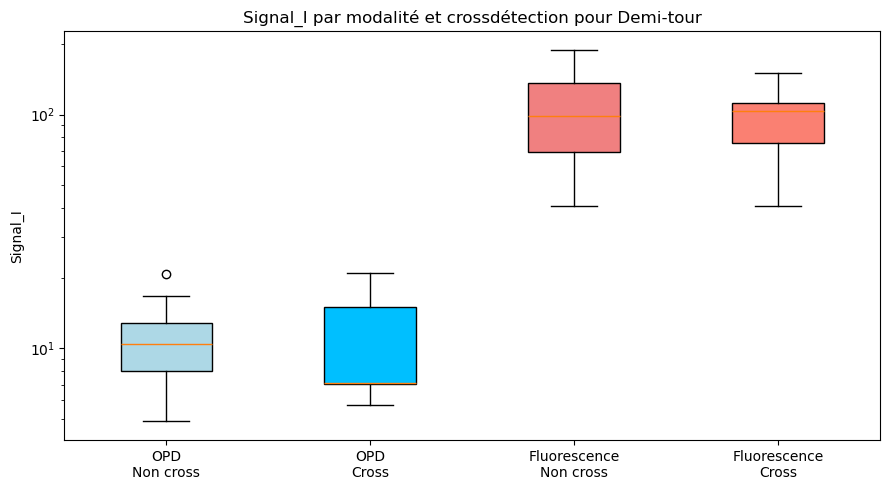

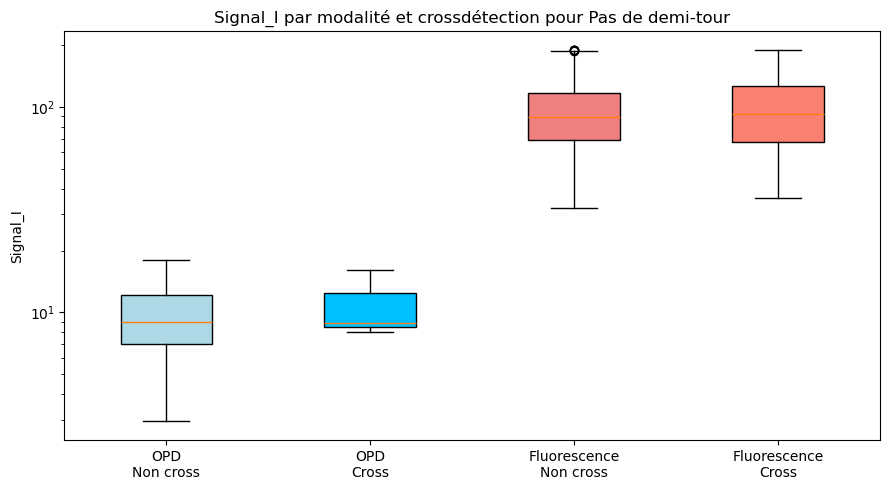

In [56]:
# Préparation des données pour le boxplot
df = df_implemented_exclude.copy()
modalites = {1: "OPD", 2: "Fluorescence"}

for demi_tour_val, demi_tour_label in zip([True, False], ["Demi-tour", "Pas de demi-tour"]):
    df_sub = df[df['demi_tour'] == demi_tour_val]
    data_plot = []
    labels_plot = []
    colors = []
    for mod_val, mod_name in modalites.items():
        # Non crossdétectées
        df_mod_non_cross = df_sub[(df_sub['ID_modality'] == mod_val) & (df_sub['crossdetection_bool_clean'] == False)]
        data_plot.append(df_mod_non_cross['signal_I'].dropna())
        labels_plot.append(f"{mod_name}\nNon cross")
        colors.append('lightblue' if mod_val == 1 else 'lightcoral')
        # Crossdétectées
        df_mod_cross = df_sub[(df_sub['ID_modality'] == mod_val) & (df_sub['crossdetection_bool_clean'] == True)]
        data_plot.append(df_mod_cross['signal_I'].dropna())
        labels_plot.append(f"{mod_name}\nCross")
        colors.append('deepskyblue' if mod_val == 1 else 'salmon')
    plt.figure(figsize=(9,5))
    box = plt.boxplot(data_plot, labels=labels_plot, patch_artist=True)
    plt.yscale('log')
    plt.title(f'Signal_I par modalité et crossdétection pour {demi_tour_label}')
    plt.ylabel('Signal_I')
    for patch, color in zip(box['boxes'], colors):
        patch.set_facecolor(color)
    plt.tight_layout()
    plt.show()

# Apprentissage sur les trajectoires en utilisant la séquence complète de positions pour prédire le demi-tour

Au vu des données et des différentes modalités (OPD/Fluorescence), il est plus intéressant de réaliser cet apprentissage en séparant la modalité, car les features d'intérêt pour ces modalités sont largement différentes et pourraient créer un biais d'apprentissage.

In [57]:
df_opd = df_implemented_exclude[df_implemented_exclude['ID_modality'] == 1].copy()
df_fluorescence = df_implemented_exclude[df_implemented_exclude['ID_modality'] == 2].copy()

## Pour OPD :

/opt/anaconda3/lib/python3.13/site-packages/xgboost/training.py:183: UserWarning: [16:41:59] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/opt/anaconda3/lib/python3.13/site-packages/xgboost/training.py:183: UserWarning: [16:41:59] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/opt/anaconda3/lib/python3.13/site-packages/xgboost/training.py:183: UserWarning: [16:41:59] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/opt/anaconda3/lib/python3.13/site-packages/xgboost/training.py:183: UserWarning: [16:41:59] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i

Meilleurs paramètres : {'learning_rate': 2, 'max_depth': 5, 'n_estimators': 1000, 'subsample': 1.0}
Accuracy: 0.8333333333333334
              precision    recall  f1-score   support

           0       0.91      0.83      0.87        12
           1       0.71      0.83      0.77         6

    accuracy                           0.83        18
   macro avg       0.81      0.83      0.82        18
weighted avg       0.84      0.83      0.84        18



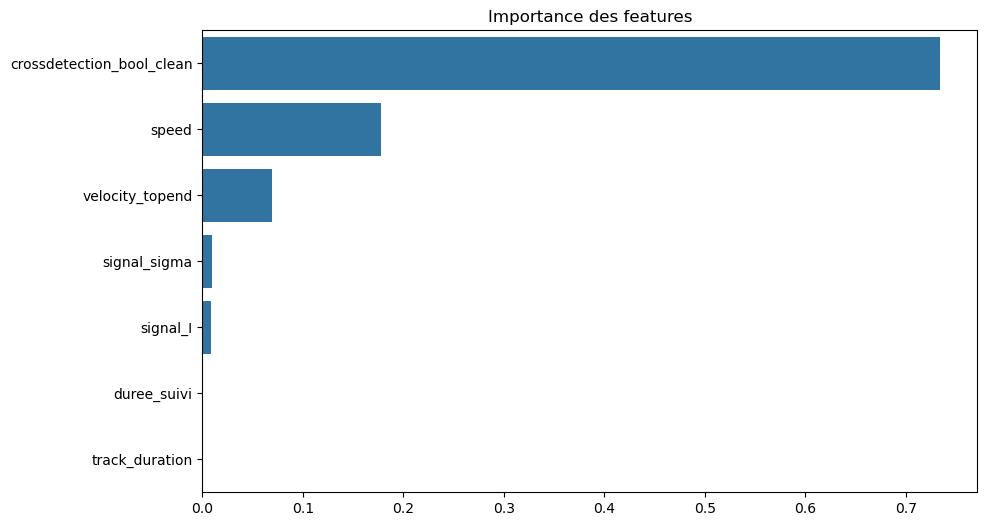

AUC: 0.9166666666666667


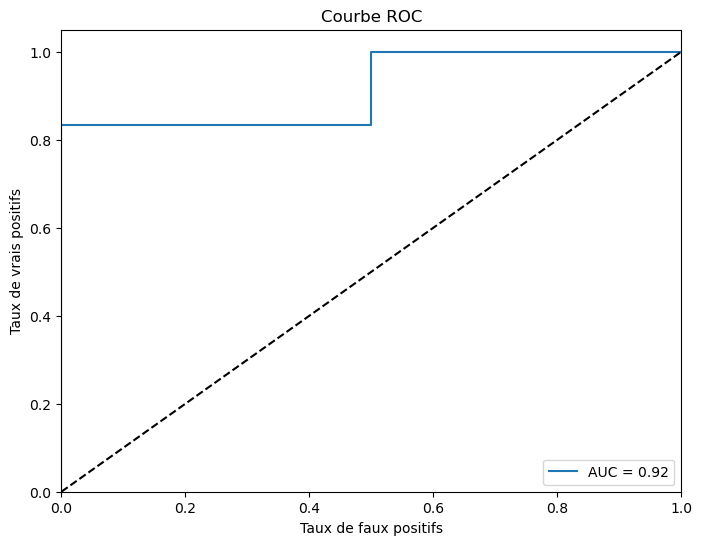

Taux de bonnes prédictions (comparaison par ID) : 83.33%
Nombre d'erreurs d'ID : 3
                            ID_IDn  demi_tour_manuel  demi_tour_modele  \
0    C20250429_20250506-B1_ACQ0283                 1                 0   
3      C20241210_20241217_ACQ17680                 0                 1   
6  C20250415_20250422-B5_ACQ252959                 0                 1   

   demi_tour_manuel_global  correct  
0                        1    False  
3                        0    False  
6                        0    False  


In [58]:
df_selected = df_opd.copy()

from imblearn.over_sampling import SMOTE

features_ml = ['speed', 'duree_suivi', 'signal_I', 'velocity_topend', 'signal_sigma', 'crossdetection_bool_clean', 'track_duration']
df_ml = df_selected.dropna(subset=features_ml + ['demi_tour'])

# 1. Séparation train/test AVANT rééquilibrage
df_train, df_test = train_test_split(
    df_ml, test_size=0.2, random_state=42, stratify=df_ml['demi_tour']
)

# 2. Définir X_train, y_train, X_test, y_test
X_train = df_train[features_ml].values
y_train = df_train['demi_tour'].astype(int).values

X_test = df_test[features_ml].values
y_test_opd = df_test['demi_tour'].astype(int).values

# 3. Rééquilibrage SMOTE sur le train uniquement
sm = SMOTE(random_state=42, k_neighbors=3)
X_train_res, y_train_res = sm.fit_resample(X_train, y_train)

from xgboost import XGBClassifier

# 4. Entraînement du modèle XGBoost
param_grid = {
    'n_estimators': [50, 100, 200, 1000],
    'max_depth': [3, 5, 10, 50, 200],
    'learning_rate': [0.000001, 0.00001, 0.0001, 0.001, 0.01, 0.1, 0.5, 2, 20],
    'subsample': [0.1, 0.8, 1.0]
}
grid = GridSearchCV(
    XGBClassifier(random_state=42, scale_pos_weight=1, use_label_encoder=False, eval_metric=['logloss', 'mlogloss']),
    param_grid,
    cv=10, n_jobs=-1, scoring='recall'
)
grid.fit(X_train_res, y_train_res)

print("Meilleurs paramètres :", grid.best_params_)

# 5. Prédiction et évaluation sur le vrai test
y_pred_opd = grid.predict(X_test)
print("Accuracy:", accuracy_score(y_test_opd, y_pred_opd))
print(classification_report(y_test_opd, y_pred_opd))

# 6. Importance des features
importances = grid.best_estimator_.feature_importances_
feature_names = features_ml
indices = np.argsort(importances)[::-1]
sorted_feature_names = [feature_names[i] for i in indices]

plt.figure(figsize=(10, 6))
sns.barplot(x=importances[indices], y=sorted_feature_names)
plt.title("Importance des features")
plt.show()

# 7. Courbe ROC/AUC
from sklearn.metrics import roc_curve, auc
y_score = grid.predict_proba(X_test)[:,1]
fpr, tpr, _ = roc_curve(y_test_opd, y_score)
print("AUC:", auc(fpr, tpr))
auc_opd = auc(fpr, tpr)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f"AUC = {auc_opd:.2f}")
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("Taux de faux positifs")
plt.ylabel("Taux de vrais positifs")
plt.title("Courbe ROC")
plt.legend(loc="lower right")
plt.show()

# 8. Comparaison par ID entre prédiction modèle et annotation manuelle
if 'ID_IDn' in df_test.columns and 'ID_IDn' in df_selected.columns:
    ids_test = df_test['ID_IDn'].values
    comparaison = pd.DataFrame({
        'ID_IDn': ids_test,
        'demi_tour_manuel': df_test['demi_tour'].astype(int).values,
        'demi_tour_modele': y_pred_opd
    })
    verite = df_selected.set_index('ID_IDn')['demi_tour'].astype(int)
    comparaison['demi_tour_manuel_global'] = comparaison['ID_IDn'].map(verite)
    nb_diff = (comparaison['demi_tour_manuel'] != comparaison['demi_tour_manuel_global']).sum()
    if nb_diff > 0:
        print(f"Attention : {nb_diff} différences entre df_test et df_selected pour la colonne 'demi_tour'.")
    comparaison['correct'] = comparaison['demi_tour_modele'] == comparaison['demi_tour_manuel_global']
    taux_bonnes_pred = comparaison['correct'].mean()
    print(f"Taux de bonnes prédictions (comparaison par ID) : {taux_bonnes_pred:.2%}")
    erreurs = comparaison[~comparaison['correct']]
    print(f"Nombre d'erreurs d'ID : {len(erreurs)}")
    print(erreurs.head())

### Analyse de l'erreur : 

Taux de bonnes prédictions (comparaison par ID) : 83.33%
Nombre d'erreurs d'ID : 3
                            ID_IDn  demi_tour_manuel  demi_tour_modele  \
0    C20250429_20250506-B1_ACQ0283                 1                 0   
3      C20241210_20241217_ACQ17680                 0                 1   
6  C20250415_20250422-B5_ACQ252959                 0                 1   

   demi_tour_calcul_global  correct  
0                        1    False  
3                        0    False  
6                        0    False  


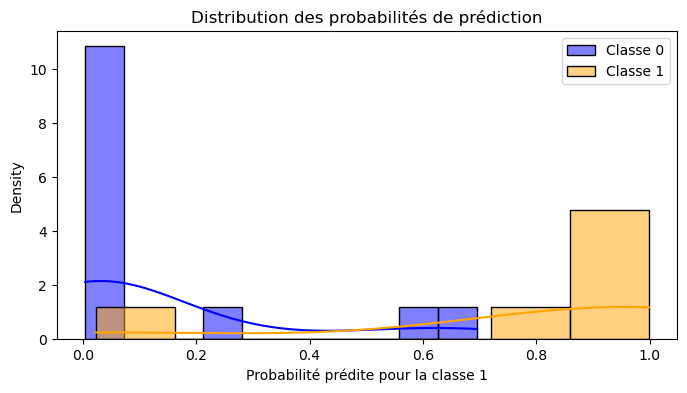

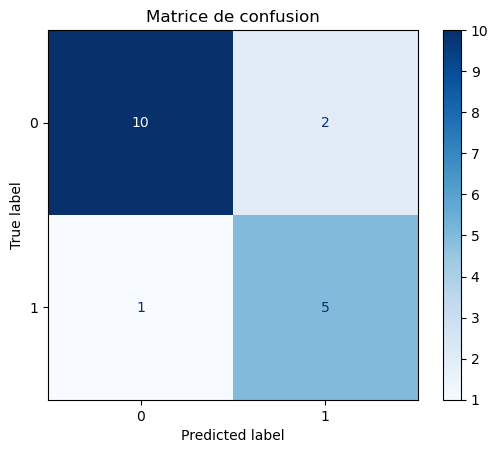

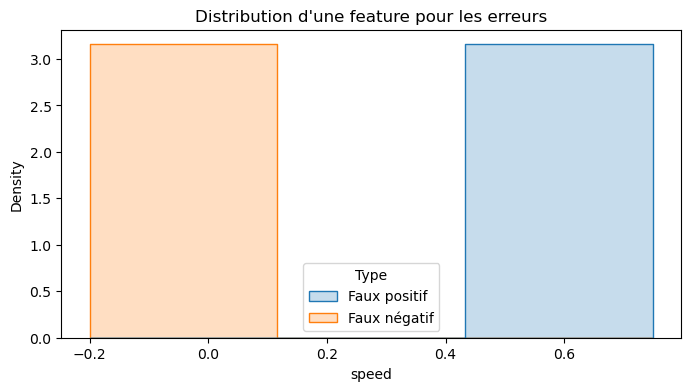

In [59]:
# 1. Prédictions et probabilités
y_pred = grid.predict(X_test)
y_proba = grid.predict_proba(X_test)[:, 1]

# 2. Identifier les faux positifs et faux négatifs
X_test_df = pd.DataFrame(X_test, columns=features_ml)
X_test_df['y_true'] = y_test_opd
X_test_df['y_pred'] = y_pred
X_test_df['proba_1'] = y_proba
X_test_df['ID_IDn'] = df_test['ID_IDn'].values
faux_positifs = X_test_df[(X_test_df['y_pred'] == 1) & (X_test_df['y_true'] == 0)]
faux_negatifs = X_test_df[(X_test_df['y_pred'] == 0) & (X_test_df['y_true'] == 1)]

# Comparaison aux vérités attendues dans df_implemented_exclude
if 'ID_IDn' in df_test.columns and 'ID_IDn' in df_selected.columns:
    ids_test = df_test['ID_IDn'].values
    comparaison = pd.DataFrame({
        'ID_IDn': ids_test,
        'demi_tour_manuel': df_test['demi_tour'].astype(int).values,
        'demi_tour_modele': y_pred
    })
    # Récupérer la vérité calculée globale
    verite = df_selected.set_index('ID_IDn')['demi_tour'].astype(int)
    comparaison['demi_tour_calcul_global'] = comparaison['ID_IDn'].map(verite)
    # Comparaison modèle vs vérité calculée
    comparaison['correct'] = comparaison['demi_tour_modele'] == comparaison['demi_tour_calcul_global']
    taux_bonnes_pred = comparaison['correct'].mean()
    print(f"Taux de bonnes prédictions (comparaison par ID) : {taux_bonnes_pred:.2%}")
    erreurs = comparaison[~comparaison['correct']]
    print(f"Nombre d'erreurs d'ID : {len(erreurs)}")
    print(erreurs.head())

# 3. Visualisation des probabilités de prédiction
plt.figure(figsize=(8,4))
sns.histplot(y_proba[y_test_opd==0], color='blue', label='Classe 0', kde=True, stat="density")
sns.histplot(y_proba[y_test_opd==1], color='orange', label='Classe 1', kde=True, stat="density")
plt.xlabel("Probabilité prédite pour la classe 1")
plt.title("Distribution des probabilités de prédiction")
plt.legend()
plt.show()

# 4. Matrice de confusion annotée
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
cm = confusion_matrix(y_test_opd, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues')
plt.title("Matrice de confusion")
plt.show()

# 5. Analyse des features pour les erreurs
plt.figure(figsize=(8,4))
sns.histplot(data=pd.concat([
    faux_positifs.assign(Type='Faux positif'),
    faux_negatifs.assign(Type='Faux négatif')
]), x=features_ml[0], hue='Type', element="step", stat="density", common_norm=False)
plt.title("Distribution d'une feature pour les erreurs")
plt.show()

## Pour Fluorescence :

In [60]:
df_selected = df_fluorescence.copy()

/opt/anaconda3/lib/python3.13/site-packages/xgboost/training.py:183: UserWarning: [16:42:07] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:738: 
Parameters: { "min_sample_split", "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/opt/anaconda3/lib/python3.13/site-packages/xgboost/training.py:183: UserWarning: [16:42:07] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:738: 
Parameters: { "min_sample_split", "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/opt/anaconda3/lib/python3.13/site-packages/xgboost/training.py:183: UserWarning: [16:42:07] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:738: 
Parameters: { "min_sample_split", "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/opt/anaconda3/lib/python3.13/site-packages/xgboost/training.py:183: UserWarning: [16:42:07] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:738: 
Parameters: { "min_samp

Meilleurs paramètres : {'learning_rate': 0.1, 'max_depth': 50, 'min_sample_split': 1, 'n_estimators': 1000, 'subsample': 0.8}
Accuracy: 0.910025706940874
              precision    recall  f1-score   support

           0       0.97      0.93      0.95       367
           1       0.31      0.50      0.39        22

    accuracy                           0.91       389
   macro avg       0.64      0.72      0.67       389
weighted avg       0.93      0.91      0.92       389



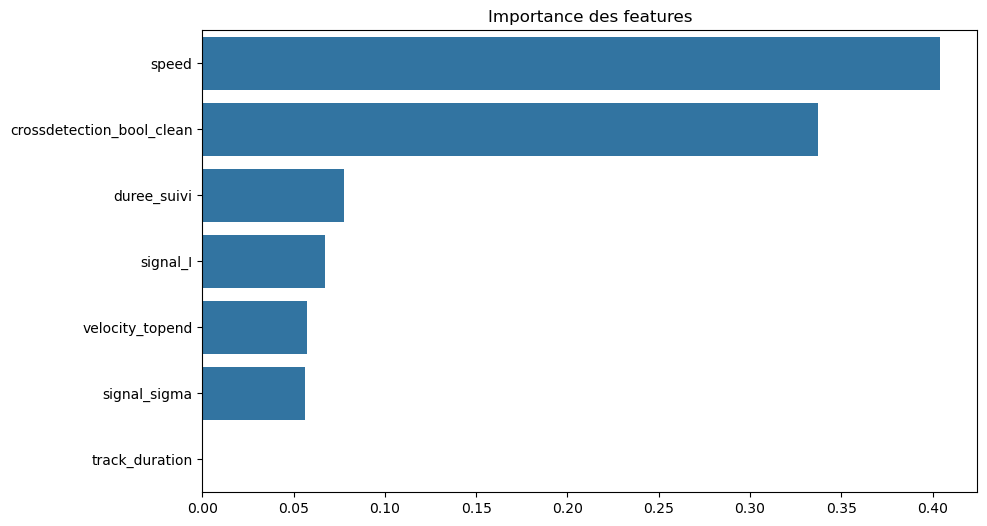

AUC: 0.8488976963091405


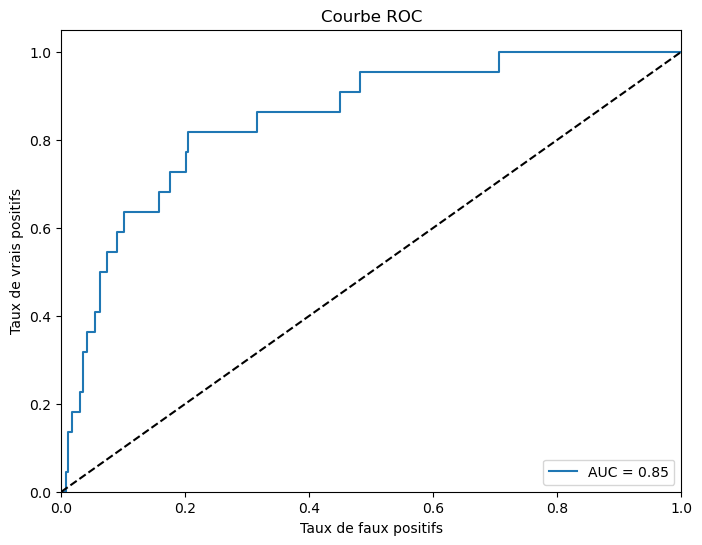

Taux de bonnes prédictions (comparaison par ID) : 91.00%
Nombre d'erreurs d'ID : 35
                             ID_IDn  demi_tour_manuel  demi_tour_modele  \
5       C20241210_20241217_ACQ19930                 1                 0   
24  C20250415_20250422-B5_ACQ141874                 0                 1   
30   C20250429_20250506-B1_ACQ02149                 0                 1   
33     C20241210_20241217_ACQ252186                 1                 0   
34  C20250415_20250422-B5_ACQ131769                 0                 1   

    demi_tour_manuel_global  correct  
5                         1    False  
24                        0    False  
30                        0    False  
33                        1    False  
34                        0    False  


In [61]:
from imblearn.over_sampling import SMOTE

features_ml = ['speed', 'duree_suivi', 'signal_I', 'velocity_topend', 'signal_sigma', 'crossdetection_bool_clean', 'track_duration']
df_ml = df_selected.dropna(subset=features_ml + ['demi_tour'])

# 1. Séparation train/test AVANT rééquilibrage
df_train, df_test = train_test_split(
    df_ml, test_size=0.2, random_state=42, stratify=df_ml['demi_tour']
)

# 2. Définir X_train, y_train, X_test, y_test
X_train = df_train[features_ml].values
y_train = df_train['demi_tour'].astype(int).values

X_test = df_test[features_ml].values
y_test_fluo = df_test['demi_tour'].astype(int).values

# 3. Rééquilibrage SMOTE sur le train uniquement
sm = SMOTE(random_state=42, k_neighbors=3)
X_train_res, y_train_res = sm.fit_resample(X_train, y_train)

from xgboost import XGBClassifier

# 4. Entraînement du modèle XGBoost
param_grid = {
    'n_estimators': [50, 100, 200, 1000],
    'max_depth': [3, 5, 10, 50, 200],
    'learning_rate': [0.000001, 0.00001, 0.0001, 0.001, 0.01, 0.1, 0.5, 2, 20],
    'subsample': [0.1, 0.8, 1.0],
    'min_sample_split': [1, 2, 5, 10]
    }

grid = GridSearchCV(
    XGBClassifier(random_state=42, scale_pos_weight=1, use_label_encoder=False, eval_metric=['logloss', 'mlogloss']),
    param_grid,
    cv=10, n_jobs=-1, scoring='recall'
)
grid.fit(X_train_res, y_train_res)

print("Meilleurs paramètres :", grid.best_params_)

# 5. Prédiction et évaluation sur le vrai test
y_pred_fluo = grid.predict(X_test)
print("Accuracy:", accuracy_score(y_test_fluo, y_pred_fluo))
print(classification_report(y_test_fluo, y_pred_fluo))

# 6. Importance des features
importances = grid.best_estimator_.feature_importances_
feature_names = features_ml
indices = np.argsort(importances)[::-1]
sorted_feature_names = [feature_names[i] for i in indices]

plt.figure(figsize=(10, 6))
sns.barplot(x=importances[indices], y=sorted_feature_names)
plt.title("Importance des features")
plt.show()

# 7. Courbe ROC/AUC
from sklearn.metrics import roc_curve, auc
y_score = grid.predict_proba(X_test)[:,1]
fpr, tpr, _ = roc_curve(y_test_fluo, y_score)
print("AUC:", auc(fpr, tpr))
auc_fluo = auc(fpr, tpr)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f"AUC = {auc_fluo:.2f}")
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("Taux de faux positifs")
plt.ylabel("Taux de vrais positifs")
plt.title("Courbe ROC")
plt.legend(loc="lower right")
plt.show()

# 8. Comparaison par ID entre prédiction modèle et annotation manuelle
if 'ID_IDn' in df_test.columns and 'ID_IDn' in df_selected.columns:
    ids_test = df_test['ID_IDn'].values
    comparaison = pd.DataFrame({
        'ID_IDn': ids_test,
        'demi_tour_manuel': df_test['demi_tour'].astype(int).values,
        'demi_tour_modele': y_pred_fluo
    })
    verite = df_selected.set_index('ID_IDn')['demi_tour'].astype(int)
    comparaison['demi_tour_manuel_global'] = comparaison['ID_IDn'].map(verite)
    nb_diff = (comparaison['demi_tour_manuel'] != comparaison['demi_tour_manuel_global']).sum()
    if nb_diff > 0:
        print(f"Attention : {nb_diff} différences entre df_test et df_selected pour la colonne 'demi_tour'.")
    comparaison['correct'] = comparaison['demi_tour_modele'] == comparaison['demi_tour_manuel_global']
    taux_bonnes_pred = comparaison['correct'].mean()
    print(f"Taux de bonnes prédictions (comparaison par ID) : {taux_bonnes_pred:.2%}")
    erreurs = comparaison[~comparaison['correct']]
    print(f"Nombre d'erreurs d'ID : {len(erreurs)}")
    print(erreurs.head())

### Analyse de l'erreur :

Taux de bonnes prédictions (comparaison par ID) : 91.00%
Nombre d'erreurs d'ID : 35
                             ID_IDn  demi_tour_manuel  demi_tour_modele  \
5       C20241210_20241217_ACQ19930                 1                 0   
24  C20250415_20250422-B5_ACQ141874                 0                 1   
30   C20250429_20250506-B1_ACQ02149                 0                 1   
33     C20241210_20241217_ACQ252186                 1                 0   
34  C20250415_20250422-B5_ACQ131769                 0                 1   

    demi_tour_calcul_global  correct  
5                         1    False  
24                        0    False  
30                        0    False  
33                        1    False  
34                        0    False  


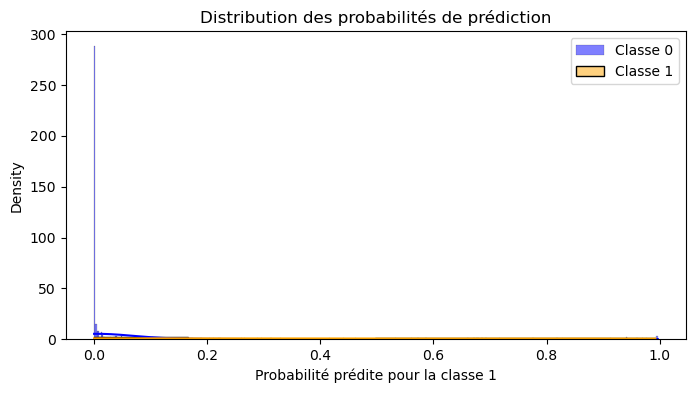

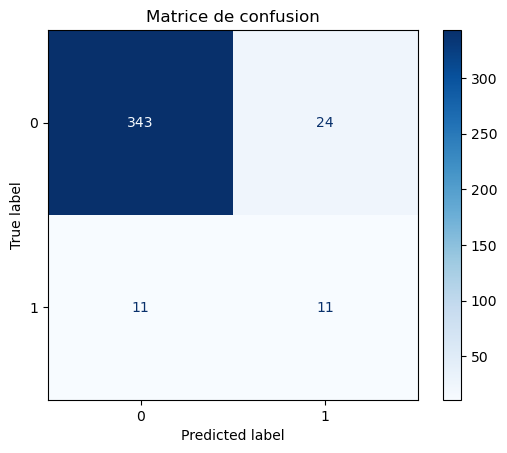

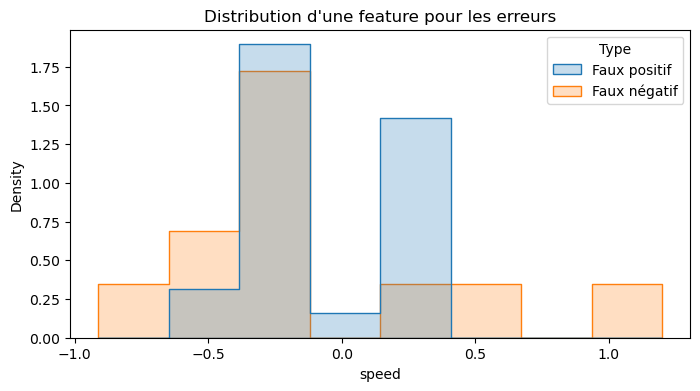

In [62]:
# 1. Prédictions et probabilités
y_pred = grid.predict(X_test)
y_proba = grid.predict_proba(X_test)[:, 1]

# 2. Identifier les faux positifs et faux négatifs
X_test_df = pd.DataFrame(X_test, columns=features_ml)
X_test_df['y_true'] = y_test_fluo
X_test_df['y_pred'] = y_pred
X_test_df['proba_1'] = y_proba
X_test_df['ID_IDn'] = df_test['ID_IDn'].values
faux_positifs = X_test_df[(X_test_df['y_pred'] == 1) & (X_test_df['y_true'] == 0)]
faux_negatifs = X_test_df[(X_test_df['y_pred'] == 0) & (X_test_df['y_true'] == 1)]

# Comparaison aux vérités attendues dans df_implemented_exclude
if 'ID_IDn' in df_test.columns and 'ID_IDn' in df_selected.columns:
    ids_test = df_test['ID_IDn'].values
    comparaison = pd.DataFrame({
        'ID_IDn': ids_test,
        'demi_tour_manuel': df_test['demi_tour'].astype(int).values,
        'demi_tour_modele': y_pred
    })
    # Récupérer la vérité calculée globale
    verite = df_selected.set_index('ID_IDn')['demi_tour'].astype(int)
    comparaison['demi_tour_calcul_global'] = comparaison['ID_IDn'].map(verite)
    # Comparaison modèle vs vérité calculée
    comparaison['correct'] = comparaison['demi_tour_modele'] == comparaison['demi_tour_calcul_global']
    taux_bonnes_pred = comparaison['correct'].mean()
    print(f"Taux de bonnes prédictions (comparaison par ID) : {taux_bonnes_pred:.2%}")
    erreurs = comparaison[~comparaison['correct']]
    print(f"Nombre d'erreurs d'ID : {len(erreurs)}")
    print(erreurs.head())

# 3. Visualisation des probabilités de prédiction
plt.figure(figsize=(8,4))
sns.histplot(y_proba[y_test_fluo==0], color='blue', label='Classe 0', kde=True, stat="density")
sns.histplot(y_proba[y_test_fluo==1], color='orange', label='Classe 1', kde=True, stat="density")
plt.xlabel("Probabilité prédite pour la classe 1")
plt.title("Distribution des probabilités de prédiction")
plt.legend()
plt.show()

# 4. Matrice de confusion annotée
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
cm = confusion_matrix(y_test_fluo, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues')
plt.title("Matrice de confusion")
plt.show()

# 5. Analyse des features pour les erreurs
plt.figure(figsize=(8,4))
sns.histplot(data=pd.concat([
    faux_positifs.assign(Type='Faux positif'),
    faux_negatifs.assign(Type='Faux négatif')
]), x=features_ml[0], hue='Type', element="step", stat="density", common_norm=False)
plt.title("Distribution d'une feature pour les erreurs")
plt.show()

## Comparaison des modèles :

In [63]:
metrics_opd = classification_report(y_test_opd, y_pred_opd, output_dict=True)
metrics_fluo = classification_report(y_test_fluo, y_pred_fluo, output_dict=True)

print("Comparaison des modèles :")
print("OPD - Recall:", metrics_opd['1']['recall'], "AUC:", auc_opd)
print("Fluorescence - Recall:", metrics_fluo['1']['recall'], "AUC:", auc_fluo)

Comparaison des modèles :
OPD - Recall: 0.8333333333333334 AUC: 0.9166666666666667
Fluorescence - Recall: 0.5 AUC: 0.8488976963091405


Exception ignored in: <function ResourceTracker.__del__ at 0x1035f5bc0>
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.13/multiprocessing/resource_tracker.py", line 82, in __del__
  File "/opt/anaconda3/lib/python3.13/multiprocessing/resource_tracker.py", line 91, in _stop
  File "/opt/anaconda3/lib/python3.13/multiprocessing/resource_tracker.py", line 116, in _stop_locked
ChildProcessError: [Errno 10] No child processes
Exception ignored in: <function ResourceTracker.__del__ at 0x105121bc0>
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.13/multiprocessing/resource_tracker.py", line 82, in __del__
  File "/opt/anaconda3/lib/python3.13/multiprocessing/resource_tracker.py", line 91, in _stop
  File "/opt/anaconda3/lib/python3.13/multiprocessing/resource_tracker.py", line 116, in _stop_locked
ChildProcessError: [Errno 10] No child processes
Exception ignored in: <function ResourceTracker.__del__ at 0x10736dbc0>
Traceback (most recent call last

Le recall mesure la capacité du modèle à ne pas manquer un demi-tour (faux négatifs). 
OPD détecte 2 fois plus de demi-tours réels que Fluorescence. Ici, un faux négatif signifie que le modèle ne détecte pas un demi-tour qui a vraiment eu lieu. Le modèle d'apprentissage sur la classe OPD est bien plus adapté pour réaliser cette tâche. 

L’AUC reflète la capacité du modèle à distinguuer correctement les demi-tours des non-demi-tours sur l’ensemble des seuils possibles.
Fluorescence a une bien meilleure AUC, ce qui signifie qu’il est globalement plus robuste pour classer correctement les séquences, avec moins d’erreurs globales (faux positifs et faux négatifs). Mais une AUC élevée ne garantit pas un bon rappel si le seuil de décision n’est pas optimisé pour le besoin recherché.